# Weight Statistics Structural Analysis of Deep Ignorance (DI) Model Artifacts

## Executive Summary

We analyzed weight statistics of four Pythia-6.9B model variants — Base (pretraining + annealing, 550B tokens), Pretraining-only (500B tokens, no annealing), Strong Filtered (trained from scratch on CBRN-filtered data), and Unlearned (CB+LAT applied to Base) — at transformer-block component granularity (qkv, proj, mlp_expand, mlp_contract). **The uploaded CB+LAT model modifies only qkv weights (≈25% of linear parameters) while leaving all MLP and proj weights bit-for-bit identical to Base — likely because this is the LoRA variant (the paper averages results across LoRA and full fine-tuned versions, and the model authors confirmed uncertainty about which was uploaded).** This qkv-only pattern is consistent with LoRA applied to attention projections, a common default configuration. The Filtered model shows cosine similarity ≈0.01–0.09 vs Base across all components (roughly what is expected for independently trained models in high-dimensional weight space), with structurally different early-layer behavior. If this is the LoRA variant, the qkv-only modification is an artifact of parameter freezing, not an inherent property of CB+LAT. The full fine-tuned version may modify all components. Nevertheless, for this specific model artifact: harmful knowledge likely remains intact in the untouched MLP weights — raising questions about robustness. **Annealing (50B tokens, 10% of pretraining) produces substantial structural change across all components** — cosine similarity between Pretraining and Base ranges from 0.86–0.96, with per-weight change std ≈0.010 uniformly. This is 3x larger than CB+LAT's qkv-only changes (std ≈0.003) and affects all four components, establishing a natural baseline for "meaningful structural change." CB+LAT does not close the gap to filtered in any structural metric — the unlearned model is, by weight statistics, essentially Base with a light qkv perturbation.

**Calibration scale for diffuse per-weight change (std/L1/L2 of ΔW):** CB+LAT (0.003, qkv only) → Annealing (0.010, all components) → Filtered (0.035, all components) — consistent 3–4x scaling across all per-weight metrics. However, **spectral norm tells a different story**: CB+LAT's qkv spectral norm (σ₁≈19.8) is actually *higher* than annealing's (σ₁≈3–10), meaning CB+LAT makes a focused directional intervention while annealing produces diffuse, distributed changes. Any unlearning method claiming structural modification should be evaluated on both dimensions: diffuse change (L1/L2/std) and directional change (spectral norm).

**Actionable takeaways:**
- **When evaluating unlearning methods, check which components are actually modified** — behavioral metrics alone cannot distinguish qkv-only interventions from deeper structural changes.
- **Methods that leave MLP weights untouched should be treated with caution** for robustness claims — the model's stored knowledge may remain intact and recoverable.
- **Weight-level structural metrics reveal unlearning depth that behavioral metrics cannot** — this CB+LAT passes behavioral evaluations (reduced WMDP-Bio scores) yet is structurally almost identical to Base, with harmful knowledge likely still stored in untouched MLP weights.

---

### Key Finding: This CB+LAT model artifact modifies only qkv weights (likely LoRA variant)

The uploaded CB+LAT model (`deep-ignorance-unfiltered-cb-lat`) modifies **only qkv weights** (query/key/value projections). All other components — proj, mlp_expand, mlp_contract — are **bit-for-bit identical** to Base. Even within qkv, the modification is light: cosine similarity between Unlearned and Base qkv weights averages 0.994 across layers, with the intervention concentrated in layers 5–10.

> **Important caveat:** The Deep Ignorance paper reports CB+LAT results averaged across two variants: one trained with LoRA, one with full fine-tuning. The model authors have confirmed uncertainty about which variant was uploaded to HuggingFace. The bit-for-bit identical non-qkv weights strongly suggest this is the **LoRA variant** with LoRA applied only to qkv projections. The full fine-tuned variant would likely show changes across all components. All findings below about "qkv-only modification" should be understood as properties of this specific model artifact, not necessarily of CB+LAT as a method.

| | CB+LAT (Unlearned) | Trained on CBRN-filtered data |
|:---|:---|:---|
| **Components modified** | qkv only (≈25% of linear weights) | All components |
| **Cosine sim to Base** | 0.994 (qkv), 1.000 (others) | 0.01–0.09 (near-default for high-D space) |
| **Structural properties** | Preserves all Base characteristics | Fundamentally different early-layer structure |
| **Analogy** | Locking the door — knowledge still stored | Building a new room — CBRN content never entered training |

**Implication for robustness:** Harmful knowledge likely remains intact in MLP weights (the model's "memory"). CB+LAT blocks retrieval via attention routing, not storage. A sufficiently clever adversarial attack might bypass the attention-level block.

---

### What CBRN-filtered training changes that CB+LAT does not

Training on CBRN-filtered data produces structural differences visible across all metrics, concentrated in early/boundary layers and mlp_contract:

| Property | Base & Unlearned | Filtered |
|:---|:---|:---|
| qkv layer 1 dip (L2, L1) | Present | **Absent** |
| mlp_contract layer 1 std dip | Does not dip | **Dips** |
| mlp_contract heavy-tailed outliers (L2–L1 disagreement) | Yes | **No** |
| mlp_contract spectral norm layer 1 spike | ≈55 | **≈33 (dampened 40%)** |

These differences are consistent across all four metrics (Mean±Std, Normalized L2, Mean L1, Spectral Norm) and indicate that Filtered develops less extreme directional specialization in early layers — particularly in mlp_contract's "write-back" pathway.

---

### Value of component-level granularity

Analyzing at the qkv / proj / mlp_expand / mlp_contract level (rather than coarser "attention vs MLP") revealed insights that would be invisible at aggregate level:

1. **CB+LAT targets qkv exclusively** — a coarser "attention" grouping would have diluted this signal with the untouched proj weights, making the intervention appear smaller than it is.

2. **mlp_contract is the most structurally distinctive component.** It shows heavy-tailed outliers at layer 1 (visible only when comparing L1 vs L2), a U-shaped spectral norm profile (boundary layers amplify ≈55x while middle layers only ≈9x), and the most dramatic depth-dependent evolution. An "MLP" aggregate would average this with mlp_expand's stable, flat profile.

3. **proj is consistently the mildest transform** across all metrics and layers — low std, low spectral norm, low L1/L2. It mostly preserves input magnitude, serving as a passive pass-through. This is invisible when grouped with qkv under "attention."

4. **Within-block sequential analysis** (qkv → proj → mlp_expand → mlp_contract) reveals a consistent processing profile: bulk statistics (L1, L2) show a stable hierarchy (mlp_expand > qkv > mlp_contract > proj) across all layers, but spectral norm breaks this pattern at boundary layers where mlp_contract amplifies as aggressively as mlp_expand.

---

## Context: Broader Research Project

This notebook is the **foundation and validation step** for the project *"Beyond Behavioral Metrics: Structural Similarity to Data-Filtered Models Predicts Machine Unlearning Robustness."*

Current unlearning evaluation relies on behavioral metrics (e.g., WMDP accuracy) that cannot distinguish true knowledge removal from output suppression — a model may appear to have forgotten while retaining recoverable knowledge in its weights. The key insight is that **data-filtered models, which never learned dangerous knowledge during pretraining, provide ground truth for what genuine ignorance looks like internally.** By measuring each unlearning method's structural distance to this "never learned" baseline, we hypothesize that methods producing internal structure closer to the filtered model will resist tampering better, because less residual knowledge remains to recover.

### Why this notebook was necessary

Before running multiple unlearning methods through a high-dimensional clustering pipeline, we needed to validate the premise — that structural metrics can distinguish "never learned" from "learned but blocked":

1. **Structural metrics distinguish what behavioral metrics cannot.** Base vs Filtered vs CB+LAT gave three points with known ground truth. Filtered (the "never learned" gold standard) is nearly orthogonal to Base across all components. CB+LAT (output suppression) is structurally almost identical to Base. Weight-level metrics captured this contrast clearly.

2. **Which metrics and at what granularity.** Component-level analysis (qkv/proj/mlp_expand/mlp_contract) is essential — a coarser "attention vs MLP" grouping would have missed that CB+LAT exclusively targets qkv. Spectral norm captures structure that L1/L2 miss. Layer depth is non-uniform (boundary layers are special). These findings directly inform how to construct the feature vector for clustering.

3. **The two endpoints of the taxonomy are established.** This CB+LAT (shallow routing change, MLP memory intact) vs Filtered (deep structural reorganization, knowledge never stored). Note: other CB/LAT implementations may produce deeper structural changes depending on configuration. The unlearning methods should fall somewhere on this spectrum, and their position predicts robustness.

4. **Baseline expectations for layer-specialization hypotheses.** With the Base/Filtered structural landscape established, we now have a reference for interpreting where each unlearning method concentrates its changes (e.g., early layers, middle layers, specific components).

### The clustering project

**Goal:** Develop an interpretability-based taxonomy of unlearning methods by measuring each method's structural distance to the filtered gold standard ("never learned" baseline) and clustering by internal structural signatures. Core hypothesis: **structural similarity to the filtered model predicts unlearning robustness.**

**Up to 13 methods** (subset selected based on feasibility):
- Gradient-based: GradAscent, GradDiff, WGA (OpenUnlearning)
- Representation-based: RMU, CEU (OpenUnlearning); Circuit Breakers, LAT (separate implementations)
- Preference-based: AltPO, NPO, SimNPO (OpenUnlearning)
- Hybrid: PDU, SatImp, UNDIAL (OpenUnlearning)

**Structural features** per method (~225D): effective rank, stable rank (32 layers × 4 components), activation norms per layer. Changes measured as Δ = (after_unlearning − baseline).

**Key research questions:**
- Which methods produce structure closest to "never learned" (gold-standard distance ranking)?
- Does structural proximity to the filtered model correlate with tamper resistance?
- Do methods cluster by mechanism (gradient/representation/preference) or by implementation ancestry?
- Do different clusters show different layer-specialization patterns?

**Artifacts:** interpretability-based taxonomy with cluster characterizations, distance-to-gold-standard rankings, and a reproducible evaluation pipeline.

## I. Data & Metrics

Exploratory analysis of weight-level statistics for three **Pythia-6.9B (GPT-NeoX)** model artifacts from the Deep Ignorance unlearning benchmark:

| Model | HuggingFace ID | Role |
|:------|:---------------|:-----|
| **Base** (Unfiltered) | `EleutherAI/deep-ignorance-unfiltered` | Original model trained on full data |
| **Strong Filtered** | `EleutherAI/deep-ignorance-e2e-strong-filter` | Retrained from scratch with hazardous data removed (gold standard) |
| **Unlearned** (CB+LAT) | `EleutherAI/deep-ignorance-unfiltered-cb-lat` | Base model with this specific CB+LAT unlearning applied |


**Architecture granularity**: Statistics are computed per **layer** (0–31) and per **transformer block component**:

| Component | Parameter name | Shape | Description |
|:----------|:---------------|:------|:------------|
| `qkv` | `attention.query_key_value.weight` | 12288 x 4096 | Projects input into concatenated Q, K, V |
| `proj` | `attention.dense.weight` | 4096 x 4096 | Projects attention output back to residual stream |
| `mlp_expand` | `mlp.dense_h_to_4h.weight` | 16384 x 4096 | Expands hidden state to 4x MLP intermediate |
| `mlp_contract` | `mlp.dense_4h_to_h.weight` | 4096 x 16384 | Contracts MLP intermediate back to hidden dim |

These are **full weight matrices** (not SVD-decomposed or low-rank); each entry is a learned float16 parameter.

**Weight-level metrics** (per layer per component):

| Metric | What it measures |
|:-------|:-----------------|
| Mean ± Std | Central tendency and spread of weight values |
| Normalized L2 (‖W‖_F / √n) | RMS weight magnitude, outlier-sensitive |
| L1 (Mean \|W\|) | Average absolute weight magnitude, robust to outliers |
| Spectral Norm σ₁(W) | Largest singular value (via SVD) — worst-case input amplification as a linear operator |
| Cosine Similarity | Directional alignment of flattened weight vectors, range [-1, 1] |

> **Caveat on cosine similarity in high-dimensional spaces:** In spaces with millions of dimensions (e.g., a 4096×16384 matrix has 67M elements), any two independently drawn vectors are nearly orthogonal by default — cosine similarity ≈ 0 is the *expected baseline*, not evidence of maximal difference. The Filtered model's cosine similarity of 0.01–0.09 vs Base is therefore roughly what you'd expect from two independently trained models, and should not be over-interpreted as "nearly opposite." SVD-based metrics (spectral norm, and later stable rank / effective rank) are more informative because they capture *which* and *how many* directions changed, not just overall alignment.


## II. Interpretation Guide

### How to read the components

Within each transformer block, computation flows sequentially: **qkv → proj → mlp_expand → mlp_contract**. Each component plays a distinct role:

| Component | Role | Analogy | What weight differences mean |
|:----------|:-----|:--------|:----------------------------|
| **qkv** | Determines what the model attends to — projects input into Query, Key, Value spaces for all attention heads | **The search engine**: decides which tokens to look at and what information to retrieve | Changes here alter *information routing* — what the model pays attention to |
| **proj** | Projects attended information back to the residual stream | **The secretary**: passes along what attention found, mostly without amplifying | Typically the mildest component; changes here are rarely the interesting signal |
| **mlp_expand** | Expands the hidden state into a high-dimensional intermediate space; scans for learned features/patterns | **The analyst**: reads the current state and activates relevant feature detectors | Changes here alter *what features the model recognizes* |
| **mlp_contract** | Compresses the expanded representation back to hidden dimension; writes the MLP's update to the residual stream | **The editor**: decides what the MLP's contribution to the next state should be | Changes here alter *what the model writes back* — its "output vote" at each layer |

**"Attention vs MLP" shorthand:** qkv + proj = attention pathway (information routing/retrieval); mlp_expand + mlp_contract = MLP pathway (often considered the model's "memory" where factual knowledge is stored and applied).

### How to read layer depth

| Layer range | Typical role | What to look for |
|:------------|:-------------|:-----------------|
| **Early (0–3)** | Token identity, positional encoding, basic syntax | Low-magnitude weights; anomalies here (e.g., layer 1 spikes) suggest specialized input processing |
| **Middle (4–24)** | Factual knowledge, semantic processing, reasoning | Stable, consistent weight profiles; this is the "bulk" of the model's computation |
| **Late (25–31)** | Decision-making, pushing logits toward the predicted next token | Components converge in magnitude; mlp_contract often grows (stronger write-back for final prediction) |

**Boundary layers (0–1 and 30–31)** are consistently the most structurally distinctive across all metrics. Differences between models tend to be most visible here.

### How to read the metrics

| Metric | What it captures | Sensitive to | Interpretation when value is high |
|:-------|:-----------------|:-------------|:----------------------------------|
| **Mean ± Std** | First two moments of the weight distribution | Overall spread; very coarse | Higher std = more diverse/specialized weights; means near zero throughout (symmetric distributions) |
| **Normalized L2** (Frobenius / √n) | RMS weight magnitude per element | Outliers (squaring amplifies large values) | Higher = more weight energy per element; component is "louder" |
| **Mean L1** (Mean \|W\|) | Average absolute weight magnitude | Bulk of the distribution (robust to outliers) | Higher = typical weights are larger; component carries more baseline signal |
| **Spectral Norm** (σ₁) | Largest singular value (from SVD, not raw weight entries) — worst-case input amplification | The single strongest directional pattern in the matrix as a linear operator | Higher = the matrix can amplify a specific input direction more; captures sharp, concentrated structure that element-wise statistics miss |

**Note:** Mean±Std, L1, and L2 are computed from raw weight entries (element-wise statistics). Spectral norm is a matrix-level property derived from SVD — it captures how the weight matrix behaves as a linear operator, not the distribution of individual scalar values. It is included here as a single SVD-derived metric to illustrate what a matrix-level view adds beyond element-wise statistics. Full SVD-based analysis (stable rank, effective rank, singular value clustering) is out of scope for this notebook and deferred to a separate analysis.

**L2 vs L1 disagreement** is diagnostic:
- L2 ≈ L1: weights are uniformly distributed (no outliers)
- L2 >> L1: heavy-tailed — a few large weights dominate (sparse specialization)
- L1 dips but L2 doesn't: the layer became *more sparse* (fewer but larger active weights)

**Spectral norm vs L1/L2:** Bulk statistics (L1, L2) capture "typical" weight behavior. Spectral norm captures the worst-case directional amplification. When they disagree (e.g., low L1/L2 but high spectral norm), the component has a few concentrated high-impact directions embedded in otherwise small weights.

## III. Notebook Structure

### Pre-Analysis: Metric Distribution Check
In this notebook, we only show the plots with base model but it can be expanded to other models

### Part 1: Individual Model EDA
Examine each model's weight statistics independently using the 4 metrics above, to understand their structural characteristics before comparing.

### Part 2: Three-way Overlay Comparison
Side-by-side plots of Base vs Filtered vs Unlearned for each metric, to visually assess how the three models differ in aggregate.

### Part 3: Element-wise Pairwise Differences (ΔW)
Compute **ΔW = W_a − W_b** element-wise and analyze the difference tensor using 5 metrics (4 above + cosine similarity). Three comparisons:

1. **Base − Filtered** (ceiling): Maximum structural difference between models trained on different data. This establishes the **upper bound** on how much unlearning *could* change the weights if it perfectly replicated the filtered model.
2. **Unlearned − Base** (unlearning impact): How much the CB+LAT unlearning procedure actually changed the weights from the original base model.
3. **Unlearned − Filtered** (gap to gold standard): How far the unlearned model remains from the gold-standard filtered model. Complementary to (1) and (2) — interpretable as *how much closer to the filtered model did unlearning get*.

# Setup

In [1]:
import sys
sys.path.insert(0, '..')
import os

import gc
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collect_weight_comparison import SmartLoader, extract_layer, classify_component
from utils.kl_style import setup as kl_setup

# Apply KL plotting style (darkgrid, deep palette, STIXGeneral font, 300 dpi)
kl_setup(high_quality=True)

plt.rcParams['figure.figsize'] = (14, 5)

Configured font family: ['STIXGeneral']

Actual font file being used: /Users/kyungeun/opt/anaconda3/envs/ds/lib/python3.9/site-packages/matplotlib/mpl-data/fonts/ttf/STIXGeneral.ttf

Seaborn style settings:
{'axes.facecolor': '#EAEAF2', 'axes.edgecolor': 'white', 'axes.grid': True, 'axes.axisbelow': True, 'axes.labelcolor': '.15', 'figure.facecolor': 'white', 'grid.color': 'white', 'grid.linestyle': '-', 'text.color': '.15', 'xtick.color': '.15', 'ytick.color': '.15', 'xtick.direction': 'out', 'ytick.direction': 'out', 'lines.solid_capstyle': <CapStyle.round: 'round'>, 'patch.edgecolor': 'w', 'patch.force_edgecolor': True, 'image.cmap': 'rocket', 'font.family': ['STIXGeneral'], 'font.sans-serif': ['Arial', 'DejaVu Sans', 'Liberation Sans', 'Bitstream Vera Sans', 'sans-serif'], 'xtick.bottom': False, 'xtick.top': False, 'ytick.left': False, 'ytick.right': False, 'axes.spines.left': True, 'axes.spines.bottom': True, 'axes.spines.right': True, 'axes.spines.top': True}


/Users/kyungeun/opt/anaconda3/envs/ds/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def fast_spectral_norm(W, num_it=10):
    """Find σ₁(W), the largest singular value of W, via power iteration.

    Algorithm:
      1. Start with random vector v (shape [cols, 1])
      2. Repeat num_it times:
           u = W @ v, normalize
           v = W^T @ u, normalize
         Each iteration applies W^TW to v. Since W^TW has eigenvalues
         σ₁², σ₂², ..., power iteration converges to the eigenvector
         for the largest eigenvalue σ₁².
      3. After convergence v ≈ right singular vector for σ₁,
         so σ₁ = ‖W @ v‖.

    Why faster than torch.linalg.matrix_norm(W, ord=2):
      Full SVD computes ALL singular values — O(min(m,n)·m·n).
      Power iteration only does num_it matrix-vector products (each O(m·n)),
      so ~10 mat-vec ops vs. a full SVD.

    10 iterations is sufficient for the largest singular value when σ₁ and σ₂
    are not extremely close, which is typical for neural network weights.
    """
    v = torch.randn(W.shape[1], 1).to(W.device)

    for _ in range(num_it):
        u = torch.matmul(W, v)
        u = u / torch.norm(u)
        v = torch.matmul(W.t(), u)
        v = v / torch.norm(v)

    sigma_1 = torch.norm(torch.matmul(W, v))
    return sigma_1.item()

## Load All Models

In [3]:
# Base
loader = SmartLoader('EleutherAI/deep-ignorance-unfiltered')
all_names = sorted(loader.get_all_param_names())
linear_names = [n for n in all_names if n.endswith('.weight')]
print(f'Base: {len(linear_names)} weight tensors found')

# Strong Filtered
loader_f = SmartLoader('EleutherAI/deep-ignorance-e2e-strong-filter')
all_names_f = sorted(loader_f.get_all_param_names())
linear_names_f = [n for n in all_names_f if n.endswith('.weight')]
print(f'Filtered: {len(linear_names_f)} weight tensors found')

# Unlearned (CB+LAT)
loader_u = SmartLoader('EleutherAI/deep-ignorance-unfiltered-cb-lat')
all_names_u = sorted(loader_u.get_all_param_names())
linear_names_u = [n for n in all_names_u if n.endswith('.weight')]
print(f'Unlearned: {len(linear_names_u)} weight tensors found')

'EleutherAI/deep-ignorance-unfiltered' not found locally. Attempting HF Hub download...


Fetching 9 files: 100%|██████████| 9/9 [00:00<00:00, 115087.61it/s]


Downloaded/Found at: /Users/kyungeun/.cache/huggingface/hub/models--EleutherAI--deep-ignorance-unfiltered/snapshots/c8df368ff247cb90b62e21e1689260701b3ff25a
Base: 195 weight tensors found
'EleutherAI/deep-ignorance-e2e-strong-filter' not found locally. Attempting HF Hub download...


Fetching 9 files: 100%|██████████| 9/9 [00:00<00:00, 120218.90it/s]


Downloaded/Found at: /Users/kyungeun/.cache/huggingface/hub/models--EleutherAI--deep-ignorance-e2e-strong-filter/snapshots/b28797cd9b615104ba9d24e6900336253323e7cf
Filtered: 195 weight tensors found
'EleutherAI/deep-ignorance-unfiltered-cb-lat' not found locally. Attempting HF Hub download...


Fetching 12 files: 100%|██████████| 12/12 [00:00<00:00, 94430.86it/s]

Downloaded/Found at: /Users/kyungeun/.cache/huggingface/hub/models--EleutherAI--deep-ignorance-unfiltered-cb-lat/snapshots/443241dd8163642929ee45146af45e8599d2f784
Unlearned: 195 weight tensors found


## Collect Per-Layer, Per-Component Weight Stats (All Models)

In [4]:
records = []

for name in linear_names:
    layer = extract_layer(name)
    component = classify_component(name)
    if layer is None or component == 'other':
        continue

    W = loader.get_param(name, 'cpu', torch.float16)
    if W is None or W.ndim != 2:
        continue

    Wf = W.float()
    # Use the fast estimation instead of the heavy linalg.matrix_norm
    spec_norm = fast_spectral_norm(Wf)
    
    records.append({
        'layer': layer,
        'component': component,
        'shape': f'{W.shape[0]}x{W.shape[1]}',
        'frobenius_norm': Wf.norm().item(),
        'mean': Wf.mean().item(),
        'std': Wf.std().item(),
        'abs_mean': Wf.abs().mean().item(),
        'abs_std': Wf.abs().std().item(),        
        'min': Wf.min().item(),
        'max': Wf.max().item(),
#        'spectral_est': torch.linalg.matrix_norm(Wf, ord=2).item(),        
        'spectral_norm': spec_norm,  # Replaces the slow torch.linalg.matrix_norm        
    })

df = pd.DataFrame(records)
print(f'{len(df)} component-layer entries')
df.head(8)
gc.collect()


128 component-layer entries


0

In [5]:
# Filtered model stats
records_f = []

for name in linear_names_f:
    layer = extract_layer(name)
    component = classify_component(name)
    if layer is None or component == 'other':
        continue

    W = loader_f.get_param(name, 'cpu', torch.float16)
    if W is None or W.ndim != 2:
        continue

    Wf = W.float()
    spec_norm = fast_spectral_norm(Wf)

    records_f.append({
        'layer': layer,
        'component': component,
        'shape': f'{W.shape[0]}x{W.shape[1]}',
        'frobenius_norm': Wf.norm().item(),
        'mean': Wf.mean().item(),
        'std': Wf.std().item(),
        'abs_mean': Wf.abs().mean().item(),
        'abs_std': Wf.abs().std().item(),
        'min': Wf.min().item(),
        'max': Wf.max().item(),
        'spectral_norm': spec_norm,
    })

df_f = pd.DataFrame(records_f)
df_f['elements'] = df_f['shape'].apply(lambda s: int(s.split('x')[0]) * int(s.split('x')[1]))
print(f'Filtered: {len(df_f)} component-layer entries')
df_f.head(4)
gc.collect()


Filtered: 128 component-layer entries


0

In [6]:
# Unlearned (CB+LAT) model stats
records_u = []

for name in linear_names_u:
    layer = extract_layer(name)
    component = classify_component(name)
    if layer is None or component == 'other':
        continue

    W = loader_u.get_param(name, 'cpu', torch.float16)
    if W is None or W.ndim != 2:
        continue

    Wf = W.float()
    spec_norm = fast_spectral_norm(Wf)

    records_u.append({
        'layer': layer,
        'component': component,
        'shape': f'{W.shape[0]}x{W.shape[1]}',
        'frobenius_norm': Wf.norm().item(),
        'mean': Wf.mean().item(),
        'std': Wf.std().item(),
        'abs_mean': Wf.abs().mean().item(),
        'abs_std': Wf.abs().std().item(),
        'min': Wf.min().item(),
        'max': Wf.max().item(),
        'spectral_norm': spec_norm,
    })

df_u = pd.DataFrame(records_u)
df_u['elements'] = df_u['shape'].apply(lambda s: int(s.split('x')[0]) * int(s.split('x')[1]))
print(f'Unlearned: {len(df_u)} component-layer entries')
df_u.head(4)
gc.collect()


Unlearned: 128 component-layer entries


0

# Pre-Analysis: Metric Distribution Check

Before any per-layer aggregation, we inspect the raw weight distributions for a single layer/component to understand what the data looks like and ensure metric behavior aligns with expectations. This is done on the **Base model** only.

## Element-wise, Per-row, and Per-col Distributions

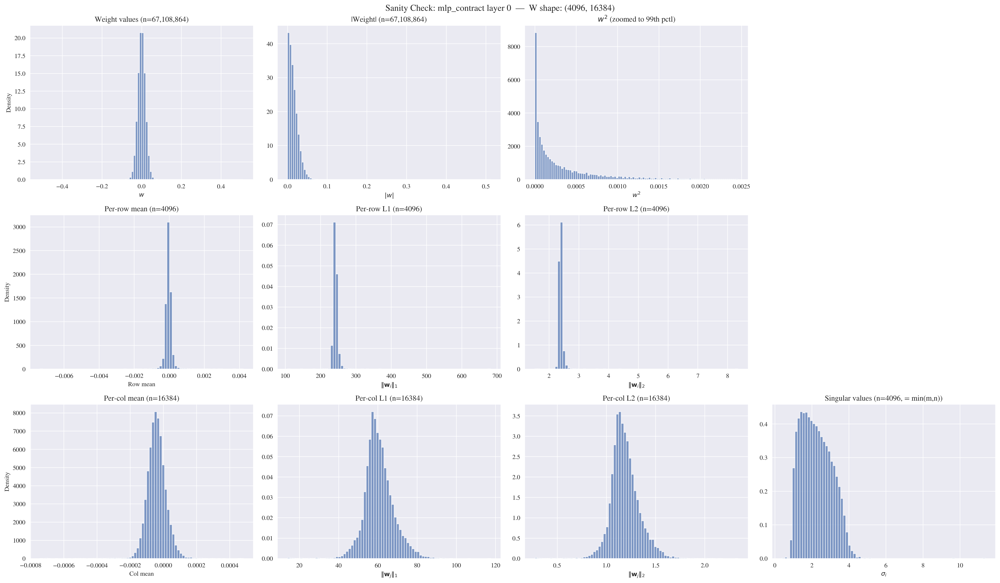

In [7]:
# Pick one layer/component to visualize
layer_idx = 0
comp = 'mlp_contract'

# Map component name to actual parameter name
comp_to_param = {
    'qkv': 'attention.query_key_value',
    'proj': 'attention.dense',
    'mlp_expand': 'mlp.dense_h_to_4h',
    'mlp_contract': 'mlp.dense_4h_to_h',
}
name = f'gpt_neox.layers.{layer_idx}.{comp_to_param[comp]}.weight'
W = loader.get_param(name, 'cpu', torch.float16).float()
W_flat = W.flatten()
n_rows, n_cols = W.shape
n_svs = min(n_rows, n_cols)

fig, axes = plt.subplots(3, 4, figsize=(22, 13))

# --- Row 0: Element-wise distributions ---
axes[0, 0].hist(W_flat.numpy(), bins=100, density=True, alpha=0.7)
axes[0, 0].set_xlabel(r'$w$')
axes[0, 0].set_title(f'Weight values (n={W_flat.numel():,})')

axes[0, 1].hist(W_flat.abs().numpy(), bins=100, density=True, alpha=0.7)
axes[0, 1].set_xlabel(r'$|w|$')
axes[0, 1].set_title(f'|Weight| (n={W_flat.numel():,})')

w_sq = (W_flat ** 2).numpy()
p99 = float(np.percentile(w_sq, 99))
axes[0, 2].hist(w_sq, bins=100, density=True, alpha=0.7, range=(0, p99))
axes[0, 2].set_xlabel(r'$w^2$')
axes[0, 2].set_title(r'$w^2$ (zoomed to 99th pctl)')

axes[0, 3].axis('off')

# --- Row 1: Per-row aggregated ---
row_mean = W.mean(dim=1).numpy()
row_l1 = torch.norm(W, p=1, dim=1).numpy()
row_l2 = torch.norm(W, p=2, dim=1).numpy()

axes[1, 0].hist(row_mean, bins=80, density=True, alpha=0.7)
axes[1, 0].set_xlabel('Row mean')
axes[1, 0].set_title(f'Per-row mean (n={n_rows})')

axes[1, 1].hist(row_l1, bins=80, density=True, alpha=0.7)
axes[1, 1].set_xlabel(r'$\|\mathbf{w}_i\|_1$')
axes[1, 1].set_title(f'Per-row L1 (n={n_rows})')

axes[1, 2].hist(row_l2, bins=80, density=True, alpha=0.7)
axes[1, 2].set_xlabel(r'$\|\mathbf{w}_i\|_2$')
axes[1, 2].set_title(f'Per-row L2 (n={n_rows})')

axes[1, 3].axis('off')

# --- Row 2: Per-column aggregated + singular values ---
col_mean = W.mean(dim=0).numpy()
col_l1 = torch.norm(W, p=1, dim=0).numpy()
col_l2 = torch.norm(W, p=2, dim=0).numpy()

axes[2, 0].hist(col_mean, bins=80, density=True, alpha=0.7)
axes[2, 0].set_xlabel('Col mean')
axes[2, 0].set_title(f'Per-col mean (n={n_cols})')

axes[2, 1].hist(col_l1, bins=80, density=True, alpha=0.7)
axes[2, 1].set_xlabel(r'$\|\mathbf{w}_j\|_1$')
axes[2, 1].set_title(f'Per-col L1 (n={n_cols})')

axes[2, 2].hist(col_l2, bins=80, density=True, alpha=0.7)
axes[2, 2].set_xlabel(r'$\|\mathbf{w}_j\|_2$')
axes[2, 2].set_title(f'Per-col L2 (n={n_cols})')

svs = torch.linalg.svdvals(W).numpy()
axes[2, 3].hist(svs, bins=80, density=True, alpha=0.7)
axes[2, 3].set_xlabel(r'$\sigma_i$')
axes[2, 3].set_title(f'Singular values (n={n_svs}, = min(m,n))')

# Row labels
for ax in axes[:, 0]:
    ax.set_ylabel('Density')

fig.suptitle(f'Sanity Check: {comp} layer {layer_idx}  —  W shape: {tuple(W.shape)}', fontsize=14)
plt.tight_layout()
os.makedirs('figs', exist_ok=True)
fig.savefig(f'../figs/sanity_check_{comp}_layer{layer_idx}.png', dpi=200, bbox_inches='tight')
plt.show()
plt.close('all')

**Observations across all 4 components (layer 0):**

*Note that these observations were obtained by running 4 components in the cell above and looking at the plots (above cell output only shows one component)*

**Terminology — rows vs columns in a weight matrix** W of shape (out_dim, in_dim):
- **Rows = output neurons**: each row is one output neuron's incoming weights — how it reads from all input features
- **Columns = input features**: each column is one input feature's outgoing weights — how it's read by all output neurons

For example, mlp_expand (16384, 4096) has 16384 output neurons (rows), each reading from 4096 input features (columns). mlp_contract (4096, 16384) reverses this: 4096 output neurons reading from 16384 input features.

> **Note on model size**: 6.9B parameters ≠ 6.9B neurons. Parameters are individual scalar weights. The model has ~655K neurons total (32 layers × (4096 hidden + 16384 MLP expanded)), but each neuron has thousands of weights (one per input feature), so 655K neurons × ~10K weights each ≈ 6.9B parameters.

**Biological analogy — transformer neurons vs brain neurons:**

The correspondence is real but partial. A biological neuron collects electrical signals through dendrites (inputs), sums them at the cell body, and fires an output through its axon if the total exceeds a threshold. A transformer "neuron" (one row of W) does something analogous: it takes a weighted sum of all input features (dot product = dendrite summation), then passes through a nonlinearity like GeLU (≈ thresholded firing).

| | Biological neuron | Transformer "neuron" (row of W) |
|---|---|---|
| **Inputs** | Dendrites receive signals from other neurons | Row reads from all input features (columns) |
| **Weights** | Synaptic strengths (potentiation/depression) | Learned scalar weights in W |
| **Summation** | Cell body integrates inputs | Dot product: $\sum w_i x_i$ |
| **Activation** | Fires if above threshold (all-or-nothing spike) | Continuous nonlinearity (GeLU, ReLU) — no discrete spike |
| **Output** | Single axon broadcasts to downstream neurons | Single scalar, broadcast to next layer |
| **Constraint** | Dale's law: a neuron is exclusively excitatory OR inhibitory | No such constraint — same neuron can excite some outputs and inhibit others |
| **Connectivity** | Sparse (~10K synapses out of ~86B possible targets) | Dense — every input connects to every output in a layer |
| **Dynamics** | Recurrent, time-dependent (spikes, refractory periods) | Single forward pass, no temporal dynamics within a layer |
| **Count** | ~86B neurons in human brain | ~655K neurons in Pythia-6.9B |
| **Plasticity** | Hebbian: "neurons that fire together wire together" | Gradient descent: weights adjusted to minimize loss |

**The superposition hypothesis** — why "features ≠ neurons" in transformers:

In the brain, individual neurons often correspond to specific concepts (e.g., "Jennifer Aniston neurons" in the medial temporal lobe). In transformers, the story is different: models appear to store more conceptual features than they have neurons by encoding features as **directions in activation space** rather than aligning them with individual neuron axes. This means a single neuron participates in representing multiple features (polysemantic neurons), and a single feature is distributed across multiple neurons.

This is directly relevant to unlearning: if harmful knowledge is stored as a direction in weight space (not in specific neurons), then understanding which *directions* changed — exactly what spectral norm and cosine similarity measure — matters more than which individual weights changed.

---

1. **Element-wise distributions** (row 0): All components show near-zero-centered weights with heavy tails. The $w^2$ plot (zoomed to 99th percentile) confirms most weight energy is concentrated near zero.

2. **Per-row mean is smooth, but L1/L2 show multi-modal structure**: The mean cancels positive/negative values, so all rows (neurons) center near 0 regardless of magnitude. L1 and L2 have no cancellation and expose **neuron-level heterogeneity** — groups of neurons with systematically different magnitudes. This is NOT from Q/K/V concatenation (proj also shows it), but from training dynamics creating natural clusters of neuron importance.

3. **L1 vs L2 skew reversal in mlp_expand**: Per-row (per-neuron) L1 and L2 show opposite skew directions. This reflects a sparsity gradient: neurons with high L1 (many moderate weights, dense readout) tend to have relatively lower L2, and vice versa. The L1/L2 ratio is effectively a sparsity measure.

4. **Transposition symmetry between mlp_expand and mlp_contract**:
   - mlp_expand (16384, 4096): rows = expanded MLP neurons, cols = hidden features
   - mlp_contract (4096, 16384): rows = hidden neurons, cols = expanded MLP neurons
   - The multi-modal structure follows the **expanded MLP dimension** (16384 neurons) regardless of whether it appears as rows or columns. The hidden dimension (4096 features) is more homogeneous — all hidden features carry roughly equal energy.

5. **Singular value spectrum**: All components show rapid decay — most singular values are small, with a few dominant directions. This is consistent with the low effective rank typical of trained weight matrices.

| Component | Shape | Rows (neurons) | Cols (features) | Per-row L1/L2 | Per-col L1/L2 |
|---|---|---|---|---|---|
| qkv | (12288, 4096) | 12288 attn neurons | 4096 hidden features | Multi-modal | Multi-modal |
| proj | (4096, 4096) | 4096 hidden neurons | 4096 hidden features | Multi-modal | Multi-modal |
| mlp_expand | (16384, 4096) | 16384 MLP neurons | 4096 hidden features | Multi-modal | Tight |
| mlp_contract | (4096, 16384) | 4096 hidden neurons | 16384 MLP features | Tight-ish | Multi-modal |

## Weight Distributions (Histograms) — Sampled Layers
By default its result is not shown but one can set b_hist = True

In [8]:
b_hist = False
if b_hist:
    sample_layers = [0, 7, 15, 23, 31]
    components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']

    fig, axes = plt.subplots(len(sample_layers), len(components), figsize=(16, 3 * len(sample_layers)),
                              sharex=False, sharey=False)

    for i, layer_idx in enumerate(sample_layers):
        for j, comp in enumerate(components):
            ax = axes[i, j]
            # Find the param name for this layer + component
            matches = [n for n in linear_names
                       if extract_layer(n) == layer_idx and classify_component(n) == comp]
            if not matches:
                ax.set_visible(False)
                continue
            W = loader.get_param(matches[0], 'cpu', torch.float16).float().flatten()
            # Subsample for plotting speed
            idx = torch.randperm(W.numel())[:50000]
            vals = W[idx].numpy()
            ax.hist(vals, bins=100, color='steelblue', alpha=0.8, edgecolor='none')
            ax.set_title(f'L{layer_idx} / {comp}', fontsize=9)
            ax.tick_params(labelsize=7)

    fig.suptitle('Weight Value Distributions — Sampled Layers (Base)', fontsize=13, y=1.01)
    plt.tight_layout()
    plt.show()
plt.close('all')  # Free figure memory


## Violin + Strip Plot: Weight Value Distributions by Component

Each point is a subsampled weight value (5k per layer). Shows the full distributional shape across all 32 layers. By default its result is not shown but one can set b_violin = True

In [9]:
b_violin = False
if b_violin:
    # Collect subsampled raw weight values into a long-form DataFrame
    samples_per_layer = 5000
    raw_records = []

    for name in linear_names:
        layer = extract_layer(name)
        component = classify_component(name)
        if layer is None or component == 'other':
            continue

        W = loader.get_param(name, 'cpu', torch.float16)
        if W is None or W.ndim != 2:
            continue

        Wf = W.float().flatten()
        idx = torch.randperm(Wf.numel())[:samples_per_layer]
        vals = Wf[idx].numpy()
        for v in vals:
            raw_records.append({'layer': layer, 'component': component, 'value': float(v)})

    df_raw = pd.DataFrame(raw_records)
    print(f'{len(df_raw)} sampled weight values ({samples_per_layer} per layer-component)')

    # --- Violin + strip: aggregate across all layers ---
    fig, ax = plt.subplots(figsize=(12, 6))
    order = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
    sns.violinplot(data=df_raw, x='component', y='value', order=order,
                   inner=None, color='lightgrey', linewidth=0.8, ax=ax, cut=0)
    sns.stripplot(data=df_raw.sample(n=min(20000, len(df_raw)), random_state=42),
                  x='component', y='value', order=order,
                  size=0.8, alpha=0.15, jitter=True, ax=ax, palette='deep')
    ax.set_xlabel('Component')
    ax.set_ylabel('Weight Value')
    ax.set_title('Weight Value Distribution by Component — All Layers (Base)')
    plt.tight_layout()
    plt.show()

    # --- Violin per component, faceted by layer group ---
    df_raw['layer_group'] = pd.cut(df_raw['layer'], bins=[0, 8, 16, 24, 32],
                                    labels=['L0-7', 'L8-15', 'L16-23', 'L24-31'],
                                    include_lowest=True)

    g = sns.catplot(data=df_raw, x='component', y='value', col='layer_group',
                    kind='violin', order=order, col_order=['L0-7', 'L8-15', 'L16-23', 'L24-31'],
                    inner='quartile', cut=0, height=5, aspect=1.0, linewidth=0.7,
                    palette='Set2')
    g.set_titles('{col_name}')
    g.set_xlabels('Component')
    g.set_ylabels('Weight Value')
    g.figure.suptitle('Weight Distributions by Component and Layer Group (Base)', y=1.02, fontsize=13)
    plt.tight_layout()
    plt.show()
plt.close('all')  # Free figure memory


---

# Part 1: Individual Model EDA
## 1.a Base Model EDA

`EleutherAI/deep-ignorance-unfiltered` — the original model trained on full data.

### Overview Table (Base)

In [10]:
df['elements'] = df['shape'].apply(lambda s: int(s.split('x')[0]) * int(s.split('x')[1]))

summary = df.groupby('component').agg(
    n_layers=('layer', 'count'),
    shape=('shape', 'first'),
    elements=('elements', 'first'),
    fro_mean=('frobenius_norm', 'mean'),
    fro_std=('frobenius_norm', 'std'),
    mean_mean=('mean', 'mean'),
    std_mean=('std', 'mean'),
    abs_mean_mean=('abs_mean', 'mean'),
    min_min=('min', 'min'),
    max_max=('max', 'max'),
).loc[['qkv', 'proj', 'mlp_expand', 'mlp_contract']]

# Add normalized columns
import numpy as np
summary['fro_mean_norm'] = summary['fro_mean'] / np.sqrt(summary['elements'])
summary['fro_std_norm'] = summary['fro_std'] / np.sqrt(summary['elements'])

summary

,n_layers,shape,elements,fro_mean,fro_std,mean_mean,std_mean,abs_mean_mean,min_min,max_max,fro_mean_norm,fro_std_norm
component,,,,,,,,,,,,
qkv,32,12288x4096,50331648,187.192,6.252,-0.000,0.026,0.021,-0.758,0.855,0.026,0.001
proj,32,4096x4096,16777216,97.311,10.772,0.000,0.024,0.019,-0.844,0.906,0.024,0.003
mlp_expand,32,16384x4096,67108864,237.615,10.499,0.000,0.029,0.023,-2.422,2.578,0.029,0.001
mlp_contract,32,4096x16384,67108864,204.418,28.651,0.000,0.025,0.020,-2.938,4.438,0.025,0.003


### 1.a.A By Layer-Component Analysis
For each 4 weights stats metrics
#### 1.a.A.i Mean + Std

**Observations:**
- All components have means very close to 0 across all 32 layers (within ±0.001), with std ≈0.02–0.04 depending on component and layer.
- **qkv** has slightly wider std (≈0.027) than **proj** (≈0.023); proj starts particularly concentrated at layer 0
- **mlp_expand** layer 1 has a distinctive upward mean spike — unique among all components
- Layer 0 shows smaller std (more concentrated weights) for qkv, proj, and mlp_expand, but **not** for mlp_contract
- **mlp_contract** has the most distinctive shape: std grows progressively through middle-to-later layers, peaking around layer 24–28, with a slight narrowing at the very end (layers 29–31)

**Interpretation:**

*Component-level:*
- **qkv std > proj std** because qkv packs three distinct functions (Query, Key, Value) into one matrix, requiring more weight diversity. proj only does a single projection back to the residual stream. *(High confidence — architectural fact)*
- **mlp_contract doesn't dip at layer 0/1** — possibly because even early on, it must write a meaningful update from the 16384-dim intermediate space back to the residual stream. Could also be an artifact of initialization scaling specific to GPT-NeoX. *(Lower confidence — plausible hypothesis)*
- **mlp_expand layer 1 mean spike** — suggests certain MLP intermediate neurons are kept systematically active at this early stage, but the root cause is unclear; could be related to initialization, training dynamics, or something Pythia-specific. *(Lower confidence — speculative)*

*Depth progression:*

| Layer range | What's happening | Weight signature | Confidence |
|:---|:---|:---|:---|
| **0–3** (early) | Basic processing: token identity, position, simple syntax | Low std — simple transforms suffice | Medium — general trend well-established, exact boundary approximate |
| **4–20** (middle) | Factual knowledge, semantic processing, complex reasoning | Stable attention std, growing MLP std | Medium — commonly cited in interp. literature but model-dependent |
| **21–31** (late) | Decision-making, pushing logits toward correct next token | Largest std, especially mlp_contract | High — consistent with model needing stronger write-back signals near output |

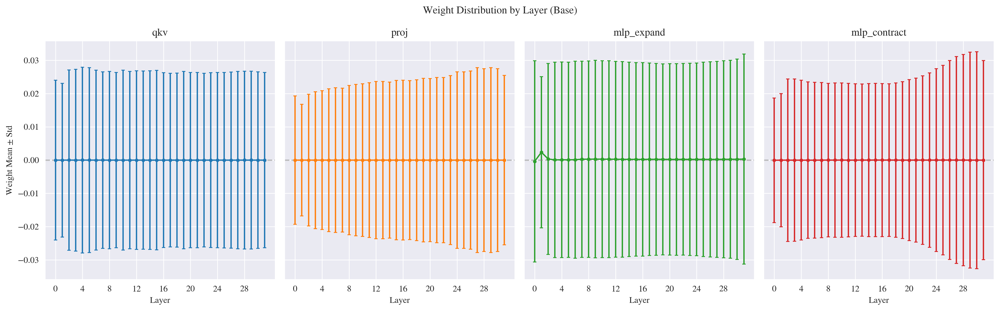

In [11]:
fig, axes = plt.subplots(1, 4, figsize=(16, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']

comp_colors = {'qkv': '#1f77b4', 'proj': '#ff7f0e', 'mlp_expand': '#2ca02c', 'mlp_contract': '#d62728'}

for ax, comp in zip(axes, components):
    sub = df[df['component'] == comp].sort_values('layer')
    # Create box plot data: need actual weight values per layer
    # Since we only have summary stats, use mean/std to approximate
    ax.errorbar(sub['layer'], sub['mean'], yerr=sub['std'], 
                marker='o', markersize=3, capsize=2, color=comp_colors[comp])
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel('Weight Mean ± Std')
plt.suptitle('Weight Distribution by Layer (Base)')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


#### 1.a.A.ii Frobenius Norm by Layer
**Unnormalized (raw ‖W‖_F)**
* **Not suitable for cross-component comparison** — qkv (50M elements) and mlp_expand/contract (67M elements) will naturally appear larger than proj (17M elements) simply due to having more weights. Shown for reference only.

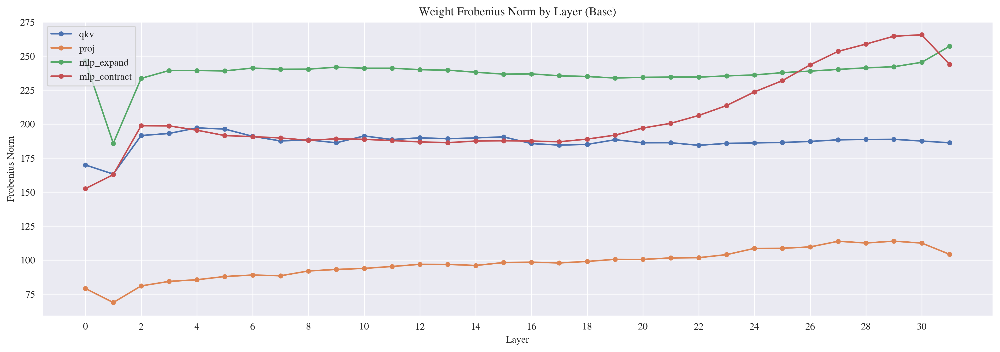

In [12]:
fig, ax = plt.subplots(figsize=(14, 5))
for comp in ['qkv', 'proj', 'mlp_expand', 'mlp_contract']:
    sub = df[df['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['frobenius_norm'], marker='o', markersize=4, label=comp)
ax.set_xlabel('Layer')
ax.set_ylabel('Frobenius Norm')
ax.set_title('Weight Frobenius Norm by Layer (Base)')
ax.legend()
ax.set_xticks(range(0, 32, 2))
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


In [13]:
b_heatmap = False
if b_heatmap:
    pivot = df.pivot(index='layer', columns='component', values='frobenius_norm')
    pivot = pivot[['qkv', 'proj', 'mlp_expand', 'mlp_contract']]

    fig, ax = plt.subplots(figsize=(6, 10))
    sns.heatmap(pivot, annot=True, fmt='.1f', cmap='YlOrRd', ax=ax, cbar_kws={'label': 'Frobenius Norm'})
    ax.set_title('Frobenius Norm Heatmap (Base)')
    ax.set_ylabel('Layer')
    ax.set_xlabel('Component')
    plt.tight_layout()
    plt.show()
plt.close('all')  # Free figure memory


**Normalized Frobenius Norm (‖W‖_F / √n)**
* RMS weight magnitude per element — enables fair cross-component comparison
* **This is the version used in all subsequent sections** (Part 2 comparisons, Part 3 diffs) since it is the only meaningful way to compare across components with different sizes

**Observations:**
- **Ordering** (layers 2–22): mlp_expand (≈0.029) > qkv (≈0.027) > mlp_contract (≈0.023) > proj (≈0.023)
- **Layer 1 dip** in qkv, proj, and mlp_expand — consistent with the std dip in 1.a. mlp_contract does not dip (slightly rises)
- **mlp_contract** shows the most drastic trajectory: starts at the bottom (≈0.019), climbs steadily, accelerates after layer 20, overtakes all others around layer 28–29, peaking at ≈0.032
- **mlp_expand is remarkably flat** (≈0.029) through layers 2–24 — the most stable component
- **qkv has a subtle early peak** around layers 2–5 (≈0.028) then gently declines through middle layers — attention weight magnitude is front-loaded
- **All four lines converge** around layer 24–26 (all near 0.026–0.029) before diverging again at the output layers
- **End-of-network divergence**: at layers 30–31, the "output" projections (proj and mlp_contract) drop while mlp_expand rises

**Interpretation:**
- mlp_expand's flatness suggests the "analyzer" maintains consistent sensitivity across most of the model *(Medium confidence)*
- The convergence at layer 24–26 before final divergence is notable — the model "equalizes" component magnitudes before the output layers make their big moves *(Medium confidence — observed pattern, unclear mechanism)*
- The "output projection drop" pattern (proj and mlp_contract both decrease at the final layers while mlp_expand rises) may reflect that the output matrices reduce their magnitude because the `embed_out` head takes over for final prediction *(Lower confidence — plausible hypothesis)*

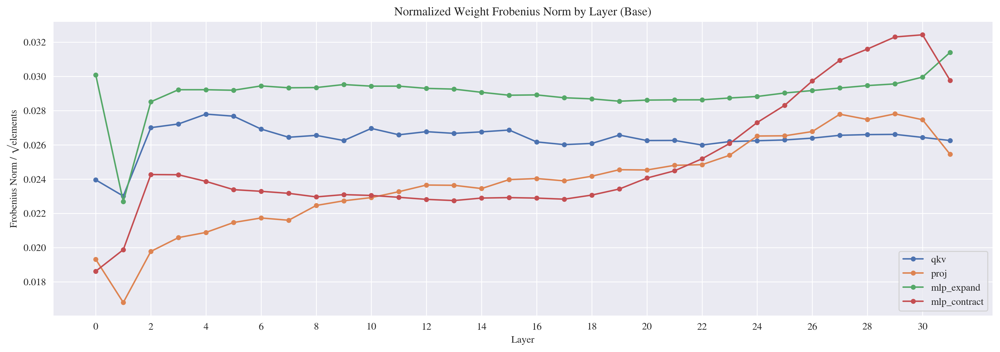

In [14]:
fig, ax = plt.subplots(figsize=(14, 5))
for comp in ['qkv', 'proj', 'mlp_expand', 'mlp_contract']:
    sub = df[df['component'] == comp].sort_values('layer')
    # Normalize by sqrt(elements)
    fro_norm_normalized = sub['frobenius_norm'] / np.sqrt(sub['elements'])
    ax.plot(sub['layer'], fro_norm_normalized, marker='o', markersize=4, label=comp)
ax.set_xlabel('Layer')
ax.set_ylabel('Frobenius Norm / √elements')
ax.set_title('Normalized Weight Frobenius Norm by Layer (Base)')
ax.legend()
ax.set_xticks(range(0, 32, 2))
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


#### 1.a.A.iii Mean Absolute Weight (L1/n) by Layer
* L1 norm / number of elements — equivalent to 4.b.ii but averages absolute values instead of squaring them, making it more robust to outliers

**Observations:**
- Overall shape is very similar to the normalized Frobenius norm (4.b.ii) — same ordering, same general trends
- **Key difference**: mlp_contract now shows **a dip at layer 1** similar to the other components, whereas in the L2 plot it did not dip

**Why the L2 vs L1 disagreement matters — mlp_contract layer 1:**

The L1 dip + L2 non-dip means mlp_contract layer 1 has a **heavy-tailed / sparse** weight distribution: most weights are small (L1 dips) but a few carry very large magnitude that keep the RMS high (L2 doesn't dip). Verified from the data:

| | Layer 0 | Layer 1 |
|:---|:---|:---|
| abs_mean (L1) | 0.0148 | **0.0134** (dips) |
| std | 0.0187 | **0.0200** (rises) |
| min | -0.512 | **-1.336** (2.5x larger) |
| max | 0.512 | **1.195** (2.3x larger) |

This is the signature of a few specialized neurons with strong connections while most remain quiet. *(High confidence — directly from the data)*

**Caveat:** This is an **empirical observation**, not a theoretically predicted behavior. The layer 1 dip in general (across qkv, proj, mlp_expand) is a commonly observed pattern in trained transformers, but the specific mlp_contract heavy-tail at layer 1 is not something we can confidently expect from first principles. To confirm whether this is universal or model-specific, we'd need to check: (1) other Pythia random seeds, (2) other Pythia scales (1.4B, 12B), (3) non-Pythia architectures (LLaMA, GPT-2).

**General rule for interpreting L2 vs L1 disagreement:**
- L2 ≈ L1: weights are uniformly distributed (no outliers)
- L2 >> L1: heavy-tailed — a few weights dominate (sparse specialization)
- L1 dips but L2 doesn't: the layer became *more sparse* (fewer but larger active weights)

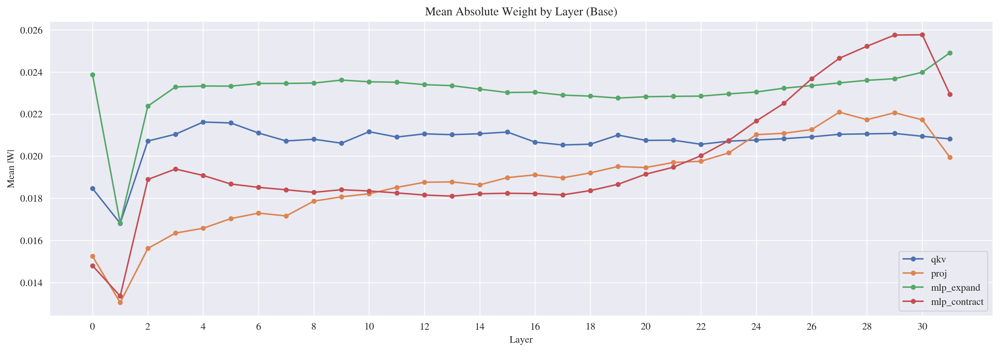

In [15]:
fig, ax = plt.subplots(figsize=(14, 5))
for comp in ['qkv', 'proj', 'mlp_expand', 'mlp_contract']:
    sub = df[df['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['abs_mean'], marker='o', markersize=4, label=comp)
ax.set_xlabel('Layer')
ax.set_ylabel('Mean |W|')
ax.set_title('Mean Absolute Weight by Layer (Base)')
ax.legend()
ax.set_xticks(range(0, 32, 2))
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


#### 1.a.A.iv Spectral Norm (σ₁) by Layer
* Largest singular value — the maximum factor by which the matrix can stretch any input vector: σ₁(W) = max over all unit vectors x of ‖Wx‖

**Does it need element normalization?**
No, unlike Frobenius norm. Spectral norm is a single max over directions, not a sum over elements. However, for random matrices σ₁ scales with (√rows + √cols), so mlp_expand/contract (192) would naturally be ≈50% higher than proj (128) even with identical per-element distributions. In practice, spectral norms are compared directly because the value has a direct physical meaning: **how much this layer amplifies an input in the worst-case direction**.

**Observations:**
- Most structurally different plot compared to L1/L2 — the component behaviors diverge significantly
- **mlp_expand** has the highest spectral norm, followed by qkv and proj which are mostly flat across layers
- **mlp_contract has a wild U-shape**: spikes to ≈55 at layer 1, drops to ≈9 in middle layers, then spikes again to ≈37 at layer 31
- At layer 1, both mlp_expand AND mlp_contract spike to ≈55 — they are equal, despite very different behavior elsewhere

**Interpretation:**
- The mlp_contract layer 1 spike **ties directly to the heavy-tailed weights** found in 4.c: those few large outlier weights create a specific input direction that gets amplified ≈55x. *(High confidence — consistent across L1, L2, and spectral norm findings)*
- The U-shape of mlp_contract (high at boundaries, low in middle) suggests the "write-back" matrix plays a critical role at the network's edges (initial state setup + final prediction) but is more subdued during middle-layer processing. *(Medium confidence — observed pattern, plausible interpretation)*
- mlp_expand's high but stable spectral norm means the "analyzer" consistently amplifies certain input directions across all layers — it's always "listening" with similar sensitivity. *(Medium confidence)*
- proj's very low spectral norm (≈5–10) means the attention output projection is a mild, non-amplifying transformation — it mostly preserves input magnitude. *(High confidence — directly from the values)*

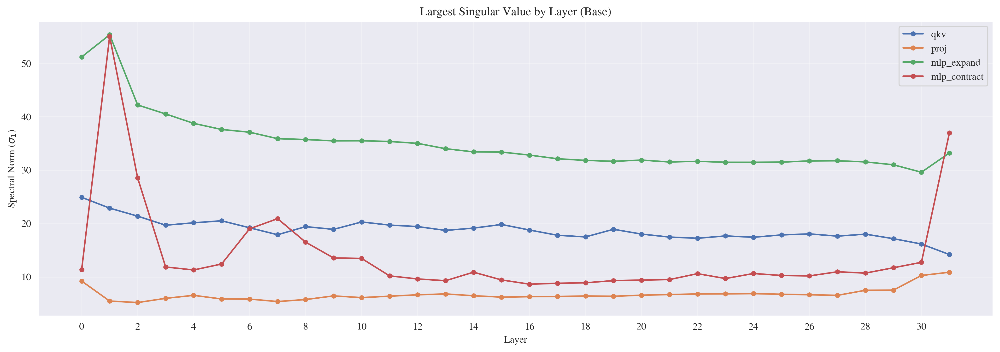

In [16]:
# 1. Create the figure and axes
fig, ax = plt.subplots(figsize=(14, 5))

# 2. Iterate and plot
for comp in ['qkv', 'proj', 'mlp_expand', 'mlp_contract']:
    sub = df[df['component'] == comp].sort_values('layer')
    if not sub.empty:
        ax.plot(sub['layer'], sub['spectral_norm'], marker='o', markersize=4, label=comp)

# 3. Finalize the formatting
ax.set_xlabel('Layer')
ax.set_ylabel('Spectral Norm ($\sigma_1$)')
ax.set_title('Largest Singular Value by Layer (Base)')
ax.legend()
ax.set_xticks(range(0, 32, 2))
ax.grid(True, alpha=0.3) # Adding a grid helps see the 'jumps' between layers

plt.tight_layout()

# 4. Crucial: This ensures only the final, complete figure is rendered
plt.show()
plt.close('all')  # Free figure memory


### 1.a.B By Sequence Analysis
Same data as the per-component subplots above, laid out in sequential transformer block order:
qkv → proj → mlp_expand → mlp_contract per layer.

#### 1.a.B.i Mean + Std

**Observations:**
- **Within-block processing profile is consistent across layers:** qkv has moderate std, proj drops to the lowest, mlp_expand has the highest std, and mlp_contract comes back down. This pattern repeats in nearly every layer. *(High confidence)*
- **Interpretation:** The network learned a consistent division of labor — attention output projection (proj) is a mild transform, while mlp_expand is the most selective/discriminative step in each block. mlp_contract compresses more gently than mlp_expand expands. *(Medium confidence — inferred from weight statistics, not activations)*
- **Layer 1 qkv shows a slight positive mean shift** — unlike other layers where means sit near zero, qkv at layer 1 has a noticeable upward bias. This suggests the first layer's attention projections encode a directional bias, possibly related to positional or token-type information in the input embeddings. *(Medium confidence)*
- **Last layer (≈L31) is less pronounced:** the within-block std differences shrink, suggesting the final block's components are more uniform — less aggressive feature selection when approaching the output projection to vocabulary. *(Medium confidence)*
- **Means are centered near zero throughout**, confirming weights are approximately symmetric — the "shape" of each block is captured by std, not mean. *(High confidence)*

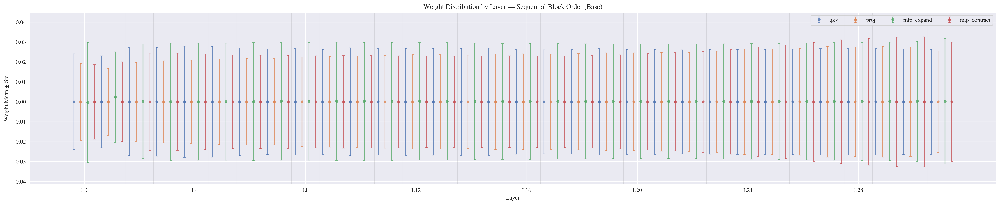

Saved to figs/seq_block_mean_std_base.png


In [17]:
# Sequential transformer block view: qkv → proj → mlp_expand → mlp_contract per layer
comp_order = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
palette = sns.color_palette("deep", 4)
comp_colors = {c: palette[i] for i, c in enumerate(comp_order)}

df_seq = df.copy()
df_seq['comp_idx'] = df_seq['component'].map({c: i for i, c in enumerate(comp_order)})
df_seq = df_seq.sort_values(['layer', 'comp_idx']).reset_index(drop=True)

fig, ax = plt.subplots(figsize=(24, 5))

for comp in comp_order:
    sub = df_seq[df_seq['component'] == comp]
    ax.errorbar(sub.index, sub['mean'], yerr=sub['std'],
                fmt='o', markersize=4, capsize=2,
                color=comp_colors[comp], label=comp, alpha=0.8)

# Layer boundaries
for layer in range(1, 32):
    ax.axvline(x=layer * 4 - 0.5, color='gray', alpha=0.2, linewidth=0.5)

ax.axhline(y=0, color='black', linewidth=0.5, alpha=0.3)
ax.set_ylabel('Weight Mean ± Std')
ax.set_title('Weight Distribution by Layer — Sequential Block Order (Base)')
ax.legend(loc='upper right', ncol=4)

# Enlarge y-axis range to give room for legend
ymin, ymax = ax.get_ylim()
ax.set_ylim(ymin * 1.15, ymax * 1.25)

# Label every 4th layer
tick_positions = [i * 4 + 1.5 for i in range(0, 32, 4)]
tick_labels = [f'L{i}' for i in range(0, 32, 4)]
ax.set_xticks(tick_positions)
ax.set_xticklabels(tick_labels)
ax.set_xlabel('Layer')

plt.tight_layout()
fig.savefig('../figs/seq_block_mean_std_base.png', dpi=300, bbox_inches='tight')
plt.show()
print("Saved to figs/seq_block_mean_std_base.png")
plt.close('all')  # Free figure memory


#### 1.a.B.ii Normalized L2 (Frobenius / √elements)

**Observations:**
- **Within-block ordering is consistent:** mlp_expand > qkv > mlp_contract > proj. Same ranking as std from mean+std — higher weight spread → higher RMS magnitude. *(High confidence)*
- **L0: all components start low (≈0.018–0.023) and tightly clustered.** The within-block spread is small — the machinery hasn't differentiated much at the input layer. *(High confidence)*
- **L1–L4: sharp ramp-up,** especially mlp_expand jumping to ≈0.030. The within-block spread widens quickly as components specialize. *(High confidence)*
- **Middle layers (≈L4–L24): very stable.** The ordering and gaps barely change — the block-level processing profile is locked in. *(High confidence)*
- **Last layers (≈L28–31): components converge.** mlp_expand comes down, proj/mlp_contract come up. The structural differentiation fades. *(High confidence)*
- **Interpretation:** The within-block hierarchy (which component carries more weight energy) is a stable structural feature that emerges after L0, holds through the middle, and dissolves at the boundaries. This mirrors the mean+std findings but provides a cleaner magnitude comparison since normalized L2 is shape-independent. *(Medium confidence)*

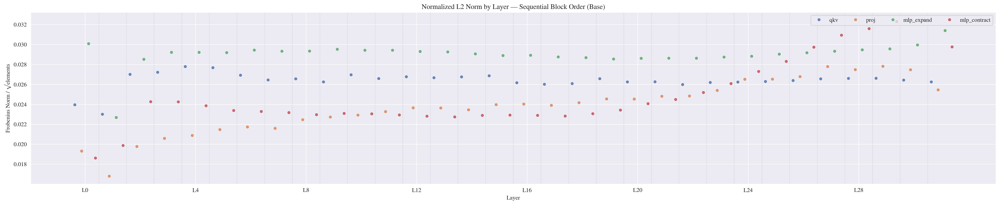

Saved to figs/seq_block_l2_norm_base.png


In [18]:
# Sequential transformer block view: Normalized Frobenius Norm
fig, ax = plt.subplots(figsize=(24, 5))

for comp in comp_order:
    sub = df_seq[df_seq['component'] == comp]
    fro_norm = sub['frobenius_norm'] / np.sqrt(sub['elements'])
    ax.plot(sub.index, fro_norm,
            'o', markersize=4,
            color=comp_colors[comp], label=comp, alpha=0.8)

for layer in range(1, 32):
    ax.axvline(x=layer * 4 - 0.5, color='gray', alpha=0.2, linewidth=0.5)

ax.set_ylabel('Frobenius Norm / √elements')
ax.set_title('Normalized L2 Norm by Layer — Sequential Block Order (Base)')
ax.legend(loc='upper right', ncol=4)

tick_positions = [i * 4 + 1.5 for i in range(0, 32, 4)]
tick_labels = [f'L{i}' for i in range(0, 32, 4)]
ax.set_xticks(tick_positions)
ax.set_xticklabels(tick_labels)
ax.set_xlabel('Layer')

plt.tight_layout()
fig.savefig('../figs/seq_block_l2_norm_base.png', dpi=300, bbox_inches='tight')
plt.show()
print('Saved to figs/seq_block_l2_norm_base.png')
plt.close('all')

#### 1.a.B.iii Mean Absolute Weight (L1/n)

**Observations:**
- **Overall structure mirrors normalized L2:** same within-block ordering (mlp_expand > qkv > mlp_contract > proj), same ramp-up at L0–L4, stable middle, convergence at the end. *(High confidence)*
- **This confirms the structural pattern is not outlier-driven.** L1 treats all elements equally, while L2 lets large values dominate. The fact that both metrics show the same hierarchy means the within-block processing profile reflects the bulk of the weight distribution, not just a few extreme entries. *(High confidence)*
- **L0 mlp_contract dips notably lower here (≈0.013) than in the L2 plot.** Consistent with mlp_contract having heavy-tailed outliers at early layers — L2 gets pulled up by those few large weights, but L1 reveals the typical element is actually quite small. *(Medium confidence — ties to known outlier findings from per-component analysis)*
- **End-layer convergence appears even more pronounced** than in the L2 view — the components cluster tighter at L28–31. *(Medium confidence)*

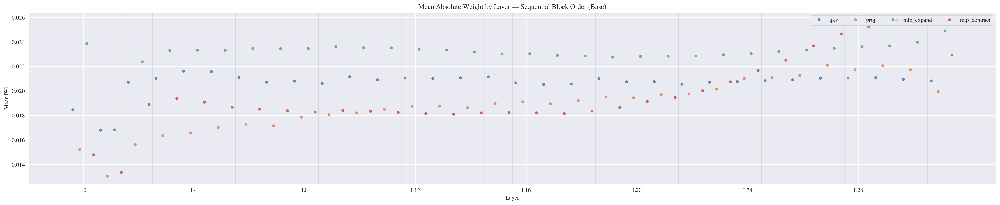

Saved to figs/seq_block_l1_mean_base.png


In [19]:
# Sequential transformer block view: Mean |W| (L1/n)
fig, ax = plt.subplots(figsize=(24, 5))

for comp in comp_order:
    sub = df_seq[df_seq['component'] == comp]
    ax.plot(sub.index, sub['abs_mean'],
            'o', markersize=4,
            color=comp_colors[comp], label=comp, alpha=0.8)

for layer in range(1, 32):
    ax.axvline(x=layer * 4 - 0.5, color='gray', alpha=0.2, linewidth=0.5)

ax.set_ylabel('Mean |W|')
ax.set_title('Mean Absolute Weight by Layer — Sequential Block Order (Base)')
ax.legend(loc='upper right', ncol=4)

tick_positions = [i * 4 + 1.5 for i in range(0, 32, 4)]
tick_labels = [f'L{i}' for i in range(0, 32, 4)]
ax.set_xticks(tick_positions)
ax.set_xticklabels(tick_labels)
ax.set_xlabel('Layer')

plt.tight_layout()
fig.savefig('../figs/seq_block_l1_mean_base.png', dpi=300, bbox_inches='tight')
plt.show()
print('Saved to figs/seq_block_l1_mean_base.png')
plt.close('all')

#### 1.a.B.iv Spectral Norm (σ₁)

**Observations:**
- **Within-block ordering is NOT stable** — unlike L1/L2 where the hierarchy (mlp_expand > qkv > mlp_contract > proj) held across all layers, spectral norm reveals a dramatically different within-block profile at boundary vs middle layers. *(High confidence)*
- **L1 spike: mlp_expand and mlp_contract both hit ≈55, nearly equal.** In L1/L2 they were always clearly separated. This means at layer 1, both MLP components amplify a worst-case input direction by the same factor — despite very different bulk weight statistics. *(High confidence)*
- **Middle layers (≈L4–L24): mlp_expand dominates (≈35), qkv sits at ≈20, but mlp_contract collapses to ≈9,** almost as low as proj. The within-block step-down from mlp_expand to mlp_contract is far larger than L1/L2 suggested. *(High confidence)*
- **Last layers (≈L28–31): mlp_contract spikes back up (≈37),** narrowing the gap with mlp_expand. The U-shape of mlp_contract is the defining feature of this plot. *(High confidence)*
- **proj is consistently the lowest (≈5–9) across all layers** — the one stable feature shared with L1/L2. *(High confidence)*
- **Interpretation:** Bulk weight statistics (L1/L2) capture the "typical" weight behavior and show a fixed hierarchy. Spectral norm captures the worst-case directional amplification, revealing that mlp_contract's role shifts dramatically: at boundary layers it amplifies as aggressively as mlp_expand, while in middle layers it becomes a mild pass-through. This suggests the boundary layers' mlp_contract encodes a few high-impact directions (consistent with the heavy-tailed outliers found in per-component analysis), while middle layers rely on mlp_expand for amplification. *(Medium confidence)*

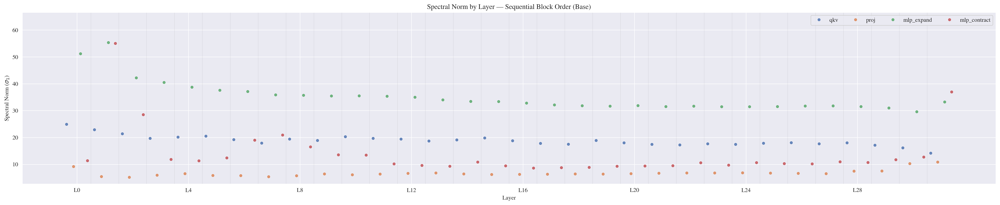

Saved to figs/seq_block_spectral_base.png


In [20]:
# Sequential transformer block view: Spectral Norm
fig, ax = plt.subplots(figsize=(24, 5))

for comp in comp_order:
    sub = df_seq[df_seq['component'] == comp]
    ax.plot(sub.index, sub['spectral_norm'],
            'o', markersize=4,
            color=comp_colors[comp], label=comp, alpha=0.8)

for layer in range(1, 32):
    ax.axvline(x=layer * 4 - 0.5, color='gray', alpha=0.2, linewidth=0.5)

ax.set_ylabel('Spectral Norm ($\sigma_1$)')
ax.set_title('Spectral Norm by Layer — Sequential Block Order (Base)')
ax.legend(loc='upper right', ncol=4)

ymin, ymax = ax.get_ylim()
ax.set_ylim(ymin, ymax * 1.15)

tick_positions = [i * 4 + 1.5 for i in range(0, 32, 4)]
tick_labels = [f'L{i}' for i in range(0, 32, 4)]
ax.set_xticks(tick_positions)
ax.set_xticklabels(tick_labels)
ax.set_xlabel('Layer')

plt.tight_layout()
fig.savefig('../figs/seq_block_spectral_base.png', dpi=300, bbox_inches='tight')
plt.show()
print('Saved to figs/seq_block_spectral_base.png')
plt.close('all')

---

## 1.b Strong Filtered Model EDA

Same structure as Base, now for `EleutherAI/deep-ignorance-e2e-strong-filter`. Data already loaded in Setup.

### Overview Table (Filtered)

In [21]:
summary_f = df_f.groupby('component').agg(
    n_layers=('layer', 'count'),
    shape=('shape', 'first'),
    elements=('elements', 'first'),
    fro_mean=('frobenius_norm', 'mean'),
    fro_std=('frobenius_norm', 'std'),
    mean_mean=('mean', 'mean'),
    std_mean=('std', 'mean'),
    abs_mean_mean=('abs_mean', 'mean'),
    min_min=('min', 'min'),
    max_max=('max', 'max'),
).loc[['qkv', 'proj', 'mlp_expand', 'mlp_contract']]

summary_f['fro_mean_norm'] = summary_f['fro_mean'] / np.sqrt(summary_f['elements'])
summary_f['fro_std_norm'] = summary_f['fro_std'] / np.sqrt(summary_f['elements'])

summary_f

,n_layers,shape,elements,fro_mean,fro_std,mean_mean,std_mean,abs_mean_mean,min_min,max_max,fro_mean_norm,fro_std_norm
component,,,,,,,,,,,,
qkv,32,12288x4096,50331648,182.206,8.783,0.000,0.026,0.020,-0.875,0.848,0.026,0.001
proj,32,4096x4096,16777216,95.850,11.350,-0.000,0.023,0.019,-0.891,0.867,0.023,0.003
mlp_expand,32,16384x4096,67108864,234.825,13.685,0.000,0.029,0.023,-1.945,1.906,0.029,0.002
mlp_contract,32,4096x16384,67108864,201.161,28.797,-0.000,0.025,0.019,-3.609,2.672,0.025,0.004


### 1.b.A By Layer-Component Analysis (Filtered)
For each 4 weights stats metrics


**Summary: mlp_contract layer 1 across metrics and models**

| Metric | Base / Unlearned | Filtered |
|:---|:---|:---|
| **Mean ± Std** | mlp_contract does NOT dip | mlp_contract dips |
| **L1 (Mean \|W\|)** | mlp_contract dips (but L2 doesn't → heavy-tailed) | mlp_contract dips |
| **Spectral Norm** | Large spike | Dampened spike |

All metrics consistently indicate: Filtered mlp_contract at layer 1 is less extreme / less specialized than Base, and unlearning does not change this — it stays like Base.


#### 1.b.A.i Mean + Std
Mean ± Std errorbar plot per component across layers.

**Observations:**
- The overall structure is very similar to the Base model: means centered near zero, std ranges ≈0.02–0.03, the early-layer ramp-up in qkv/proj, and the late-layer spread in proj and mlp_contract all mirror Base closely.
- This suggests that data filtering (removing harmful content from the training set) preserves the broad weight distribution shape — the first two moments (mean, std) are largely unchanged.
- **Key difference: mlp_contract std dips at layer 1** — in Base (and Unlearned), mlp_contract was the *exception* that did NOT dip at layer 1 while all other components did. In Filtered, mlp_contract now joins the other components in showing reduced std at layer 1. This is consistent with the spectral norm finding (dampened mlp_contract layer 1 spike) — both indicate the Filtered model develops less extreme weight specialization in mlp_contract at early layers.
- The fact that Unlearned matches Base (not Filtered) on this property suggests unlearning (CB+LAT) did not alter this structural characteristic.


**Caveat [High confidence]:**
Mean ± Std is a very coarse summary (just the first two moments of the distribution). Two weight matrices can have identical mean and std yet differ substantially in their internal structure. The similarity here tells us the *marginal distribution envelope* is preserved, not that the actual weight values are close. The element-wise comparisons in Part 3 reveal the real differences — e.g., cosine similarity between Base and Filtered weights is ≈0.01–0.09, meaning the weight *directions* are nearly orthogonal despite sharing the same distributional shape.

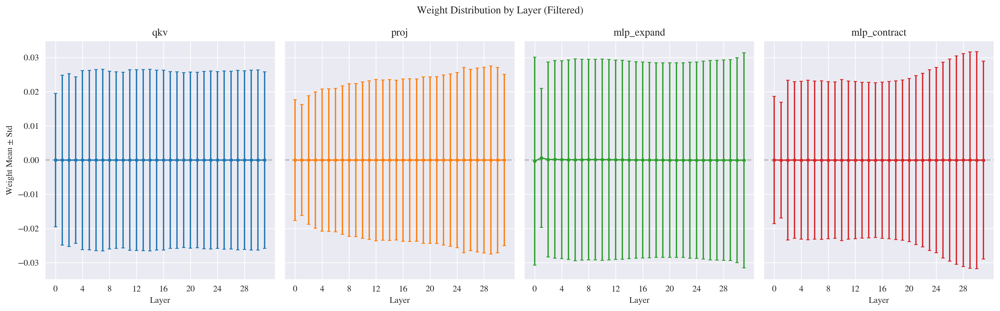

In [22]:
fig, axes = plt.subplots(1, 4, figsize=(16, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': '#1f77b4', 'proj': '#ff7f0e', 'mlp_expand': '#2ca02c', 'mlp_contract': '#d62728'}

for ax, comp in zip(axes, components):
    sub = df_f[df_f['component'] == comp].sort_values('layer')
    ax.errorbar(sub['layer'], sub['mean'], yerr=sub['std'],
                marker='o', markersize=3, capsize=2, color=comp_colors[comp])
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel('Weight Mean ± Std')
plt.suptitle('Weight Distribution by Layer (Filtered)')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


#### 1.b.A.ii Normalized L2 (Frobenius / √elements) by Layer (Filtered)

**Observations:**
- Overall structure largely mirrors the Base model — same ordering (mlp_expand > qkv > mlp_contract ≈ proj in the middle layers), same convergence in later layers, same mlp_contract climb.
- **Notable difference: the qkv layer 1 dip is gone** — in the Base model, qkv/proj/mlp_expand all showed a clear dip at layer 1, but here qkv rises smoothly from layer 0 to layer 2 without dipping.

**Why this matters [Medium confidence]:**
The disappearance of the qkv layer 1 dip suggests this feature is **data-dependent**, not purely architectural. If the dip were caused by initialization or model architecture alone, it would appear identically in both Base and Filtered. The fact that filtering the training data (removing harmful content) changes this early-layer behavior implies the dip in Base is shaped by what the model learned from the data — specifically, whatever early-layer qkv processing the unfiltered data induced is not replicated when the model trains on filtered data.

**Caveat [Lower confidence]:**
We cannot conclusively rule out random seed or training-run variance as the cause, since these are different training runs. Confirming this would require comparing multiple random seeds of the same model on the same data.

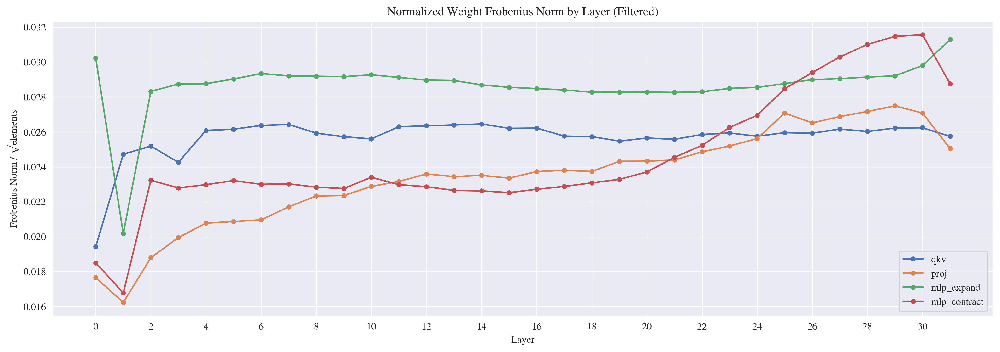

In [23]:
fig, ax = plt.subplots(figsize=(14, 5))
for comp in ['qkv', 'proj', 'mlp_expand', 'mlp_contract']:
    sub = df_f[df_f['component'] == comp].sort_values('layer')
    fro_norm_normalized = sub['frobenius_norm'] / np.sqrt(sub['elements'])
    ax.plot(sub['layer'], fro_norm_normalized, marker='o', markersize=4, label=comp)
ax.set_xlabel('Layer')
ax.set_ylabel('Frobenius Norm / √elements')
ax.set_title('Normalized Weight Frobenius Norm by Layer (Filtered)')
ax.legend()
ax.set_xticks(range(0, 32, 2))
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


#### 1.b.A.iii L1 Distribution: Mean |W| by Layer (Filtered)

**Observations:**
- Consistent with the L2 (Normalized Frobenius) findings: **qkv layer 1 dip is gone** — qkv rises smoothly from layer 0 to layer 2 without dipping.
- However, **proj and mlp_contract still dip at layer 1** (proj drops to ≈0.0125, mlp_contract to ≈0.011), so the disappearance of the dip is component-specific to qkv.

**Interpretation [Medium confidence]:**
Whatever early-layer qkv processing the unfiltered data induced (that caused the layer 1 dip) is not replicated when the model trains on filtered data. The fact that proj and mlp_contract still dip suggests those components' layer 1 behavior is more robust to data composition — possibly driven by architecture or initialization rather than data content.

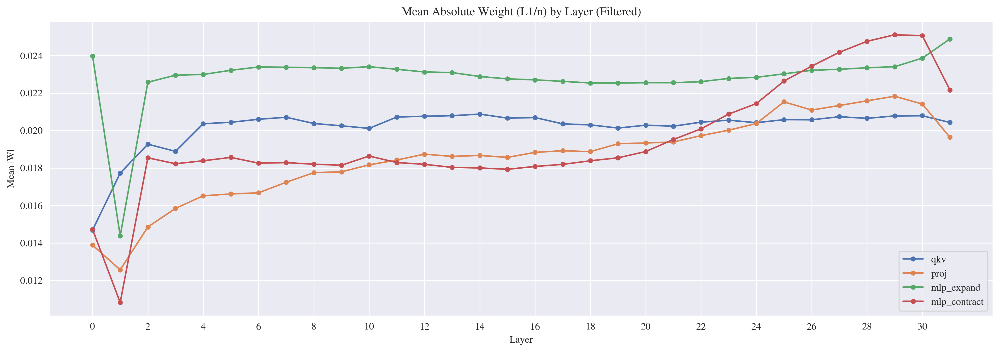

In [24]:
fig, ax = plt.subplots(figsize=(14, 5))
for comp in ['qkv', 'proj', 'mlp_expand', 'mlp_contract']:
    sub = df_f[df_f['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['abs_mean'], marker='o', markersize=4, label=comp)
ax.set_xlabel('Layer')
ax.set_ylabel('Mean |W|')
ax.set_title('Mean Absolute Weight (L1/n) by Layer (Filtered)')
ax.legend()
ax.set_xticks(range(0, 32, 2))
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


#### 1.b.A.iv Spectral Norm (σ₁) by Layer (Filtered)

**Observations:**
- Overall structure matches Base: mlp_expand dominates, proj is lowest, qkv in between.
- **mlp_contract layer 1 spike is far less pronounced** — still peaks at layer 1 (≈33) but drops sharply by layer 3 (≈11), much less dramatic than in Base.
- **mlp_contract never exceeds mlp_expand** throughout layers 2–30 — in Base, mlp_contract climbed steadily and caught up to mlp_expand in the later layers. Here it stays well below (≈10–11 vs ≈33–35) until only the very last layer (≈40 vs ≈32 at layer 31).

**Interpretation [Medium confidence]:**
The spectral norm captures the *maximum directional stretch* of the weight matrix. The fact that mlp_contract's spectral norm is systematically lower in Filtered suggests the model trained on filtered data develops less extreme directional specialization in its "write-back" pathway. The Base model appears to develop sharper, more concentrated singular directions in mlp_contract — possibly reflecting stronger memorization of specific patterns in unfiltered data that require dedicated high-magnitude projection directions.

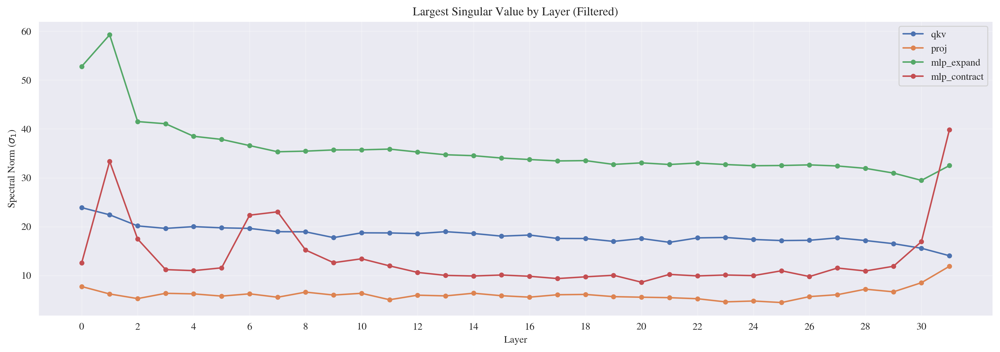

In [25]:
# 1. Create the figure and axes
fig, ax = plt.subplots(figsize=(14, 5))

# 2. Iterate and plot
for comp in ['qkv', 'proj', 'mlp_expand', 'mlp_contract']:
    sub = df_f[df_f['component'] == comp].sort_values('layer')
    if not sub.empty:
        ax.plot(sub['layer'], sub['spectral_norm'], marker='o', markersize=4, label=comp)

# 3. Finalize the formatting
ax.set_xlabel('Layer')
ax.set_ylabel('Spectral Norm ($\sigma_1$)')
ax.set_title('Largest Singular Value by Layer (Filtered)')
ax.legend()
ax.set_xticks(range(0, 32, 2))
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


---

## 1.c Unlearned (CB+LAT) Model EDA

Same structure, now for `EleutherAI/deep-ignorance-unfiltered-cb-lat`. Data already loaded in Setup.

### Overview Table (Unlearned)

In [26]:
summary_u = df_u.groupby('component').agg(
    n_layers=('layer', 'count'),
    shape=('shape', 'first'),
    elements=('elements', 'first'),
    fro_mean=('frobenius_norm', 'mean'),
    fro_std=('frobenius_norm', 'std'),
    mean_mean=('mean', 'mean'),
    std_mean=('std', 'mean'),
    abs_mean_mean=('abs_mean', 'mean'),
    min_min=('min', 'min'),
    max_max=('max', 'max'),
).loc[['qkv', 'proj', 'mlp_expand', 'mlp_contract']]

summary_u['fro_mean_norm'] = summary_u['fro_mean'] / np.sqrt(summary_u['elements'])
summary_u['fro_std_norm'] = summary_u['fro_std'] / np.sqrt(summary_u['elements'])

summary_u

,n_layers,shape,elements,fro_mean,fro_std,mean_mean,std_mean,abs_mean_mean,min_min,max_max,fro_mean_norm,fro_std_norm
component,,,,,,,,,,,,
qkv,32,12288x4096,50331648,188.332,6.350,-0.000,0.027,0.021,-0.758,0.853,0.027,0.001
proj,32,4096x4096,16777216,97.311,10.772,0.000,0.024,0.019,-0.844,0.906,0.024,0.003
mlp_expand,32,16384x4096,67108864,237.615,10.499,0.000,0.029,0.023,-2.422,2.578,0.029,0.001
mlp_contract,32,4096x16384,67108864,204.418,28.651,0.000,0.025,0.020,-2.938,4.438,0.025,0.003


### 1.c.A By Layer-Component Analysis (Unlearned)
#### 1.c.A.i Mean + Std

Mean ± Std errorbar plot per component across layers.

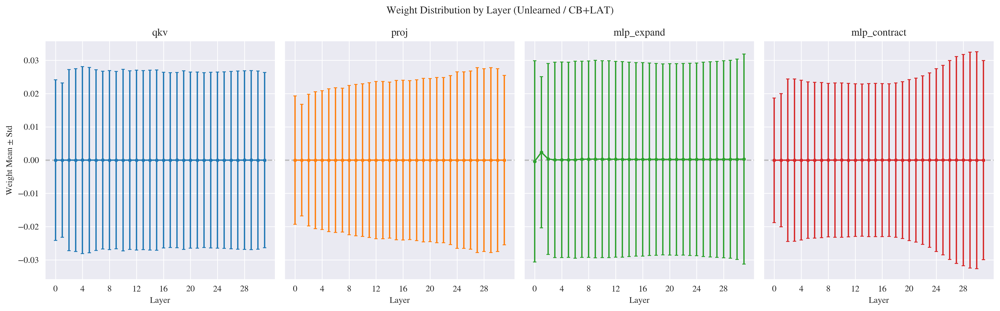

In [27]:
fig, axes = plt.subplots(1, 4, figsize=(16, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': '#1f77b4', 'proj': '#ff7f0e', 'mlp_expand': '#2ca02c', 'mlp_contract': '#d62728'}

for ax, comp in zip(axes, components):
    sub = df_u[df_u['component'] == comp].sort_values('layer')
    ax.errorbar(sub['layer'], sub['mean'], yerr=sub['std'],
                marker='o', markersize=3, capsize=2, color=comp_colors[comp])
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel('Weight Mean ± Std')
plt.suptitle('Weight Distribution by Layer (Unlearned / CB+LAT)')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


#### 1.c.A.ii Normalized L2 (Frobenius / √elements) by Layer (Unlearned)

**Observations:**
- Overall structure closely matches Base — same ordering (mlp_expand > qkv > mlp_contract ≈ proj in middle layers), same mlp_contract climb in later layers, same convergence around layer 24–26.
- **qkv layer 1 dip is present**, matching Base and differing from Filtered (where it was absent). This confirms that unlearning (CB+LAT) preserves Base's early-layer qkv structure — only retraining on filtered data removes the dip.

**Layer 1 behavior across models (all metrics):**

| Property | Base | Unlearned | Filtered |
|:---|:---|:---|:---|
| qkv layer 1 dip | Yes | Yes | **No** |
| mlp_contract layer 1 non-dip (std) | Yes | Yes | **Dips** |
| mlp_contract spectral norm spike | Large | Large | **Dampened** |

Unlearned consistently matches Base — CB+LAT is a targeted weight perturbation, not a structural reorganization.

**Interpretation [Medium confidence]:**
CB+LAT unlearning operates as a targeted perturbation on Base weights rather than a full retraining. It inherits Base's structural properties (including the qkv layer 1 dip) because it doesn't fundamentally reorganize early-layer representations — it modifies specific directions related to the unlearning objective while leaving the overall weight geometry intact.

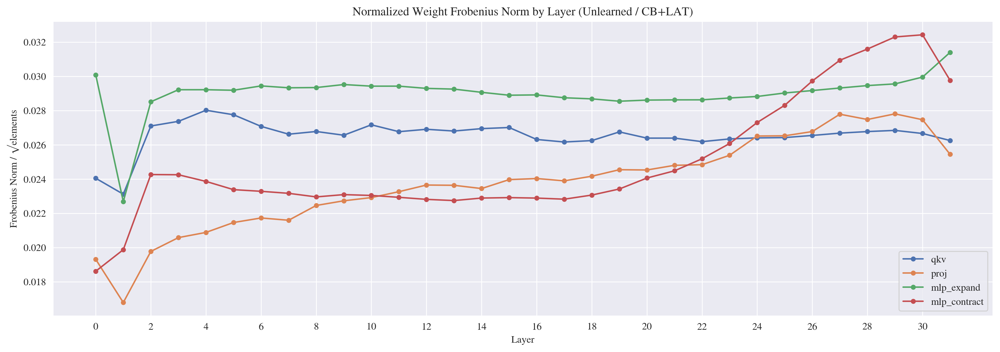

In [28]:
fig, ax = plt.subplots(figsize=(14, 5))
for comp in ['qkv', 'proj', 'mlp_expand', 'mlp_contract']:
    sub = df_u[df_u['component'] == comp].sort_values('layer')
    fro_norm_normalized = sub['frobenius_norm'] / np.sqrt(sub['elements'])
    ax.plot(sub['layer'], fro_norm_normalized, marker='o', markersize=4, label=comp)
ax.set_xlabel('Layer')
ax.set_ylabel('Frobenius Norm / √elements')
ax.set_title('Normalized Weight Frobenius Norm by Layer (Unlearned / CB+LAT)')
ax.legend()
ax.set_xticks(range(0, 32, 2))
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


#### 1.c.A.iii L1 Distribution: Mean |W| by Layer (Unlearned)

**Observations:**
- Overall trend matches Base — same ordering, same shape across layers.
- **mlp_contract layer 1 dip in L1 is present**, matching Base. Combined with the absence of a dip in L2 (previous plot), the L2-L1 disagreement (heavy-tailed signature) is preserved in Unlearned — a few large-magnitude weights keep the RMS high while most weights are small.

**L2 vs L1 disagreement at mlp_contract layer 1 across models:**

| Model | L1 dips? | L2 dips? | Heavy-tailed? |
|:---|:---|:---|:---|
| **Base** | Yes | No | Yes — few large outlier weights |
| **Unlearned** | Yes | No | Yes — same signature as Base |
| **Filtered** | Yes | Yes | No — uniform dip, no outlier excess |

This confirms CB+LAT unlearning preserves the sparse specialization pattern in mlp_contract layer 1 that Base developed from training on unfiltered data. Filtered, having been retrained from scratch, does not develop this heavy-tailed structure.

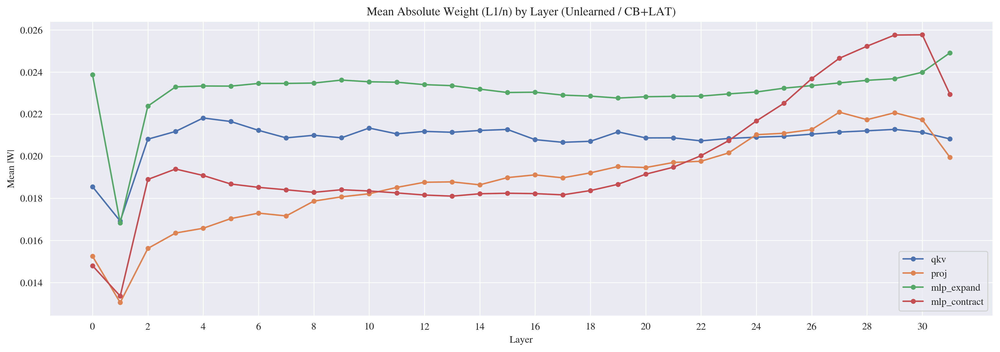

In [29]:
fig, ax = plt.subplots(figsize=(14, 5))
for comp in ['qkv', 'proj', 'mlp_expand', 'mlp_contract']:
    sub = df_u[df_u['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['abs_mean'], marker='o', markersize=4, label=comp)
ax.set_xlabel('Layer')
ax.set_ylabel('Mean |W|')
ax.set_title('Mean Absolute Weight (L1/n) by Layer (Unlearned / CB+LAT)')
ax.legend()
ax.set_xticks(range(0, 32, 2))
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


#### 1.c.A.iv Spectral Norm (σ₁) by Layer (Unlearned)

**Observations:**
- Matches Base almost identically — mlp_contract spikes to ≈55 at layer 1 (same as Base), with a secondary bump around layers 6–7 (≈20). Overall ordering and trajectory are the same.
- Filtered, by contrast, only reaches ≈33 at layer 1 — the spike is dampened by ≈40%.

**This completes the consistent picture across all 4 metrics for Part 1:**

| Property | Base | Unlearned | Filtered |
|:---|:---|:---|:---|
| qkv layer 1 dip (L2, L1) | Yes | Yes | **No** |
| mlp_contract std non-dip (Mean±Std) | Yes | Yes | **Dips** |
| mlp_contract L2-L1 disagreement (heavy-tail) | Yes | Yes | **No** |
| mlp_contract spectral norm layer 1 spike | ≈55 | ≈55 | **≈33 (dampened)** |

**Takeaway:** CB+LAT unlearning preserves all of Base's structural weight properties. Filtered, trained from scratch on clean data, develops a fundamentally different early-layer structure — particularly in mlp_contract, which shows less extreme specialization across every metric.

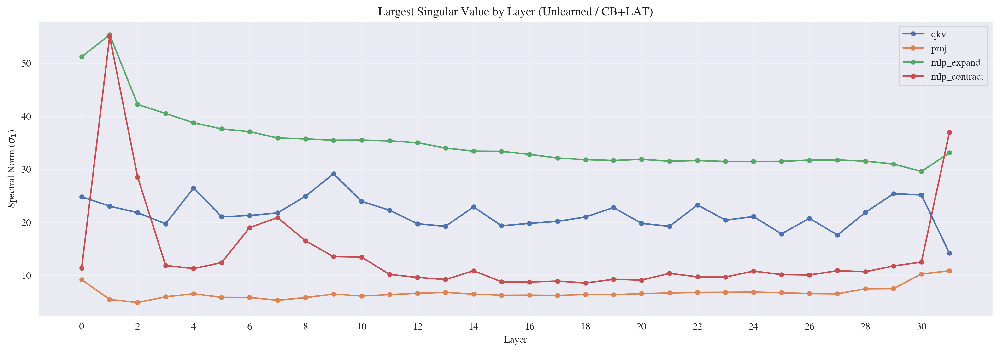

In [30]:
fig, ax = plt.subplots(figsize=(14, 5))
for comp in ['qkv', 'proj', 'mlp_expand', 'mlp_contract']:
    sub = df_u[df_u['component'] == comp].sort_values('layer')
    if not sub.empty:
        ax.plot(sub['layer'], sub['spectral_norm'], marker='o', markersize=4, label=comp)
ax.set_xlabel('Layer')
ax.set_ylabel('Spectral Norm ($\sigma_1$)')
ax.set_title('Largest Singular Value by Layer (Unlearned / CB+LAT)')
ax.legend()
ax.set_xticks(range(0, 32, 2))
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


---

# Part 2: Three-way Overlay Comparison

Side-by-side comparison of weight statistics across all 32 layers, one subplot per component.


**Component-level summary of Part 2:**

| Component | Base vs Unlearned | Base vs Filtered |
|:---|:---|:---|
| **qkv** | Differ in spectral norm (Unlearned oscillates) | Differ in all metrics (layer 1 dip, lower magnitude) |
| **proj** | Very similar | Filtered slightly lower |
| **mlp_expand** | Very similar | Filtered slightly lower, most stable component |
| **mlp_contract** | Very similar | Filtered differs most (layer 1 spike dampened, no heavy tail) |


## 2.a Mean + Std

Mean ± Std errorbar plot per component across layers.

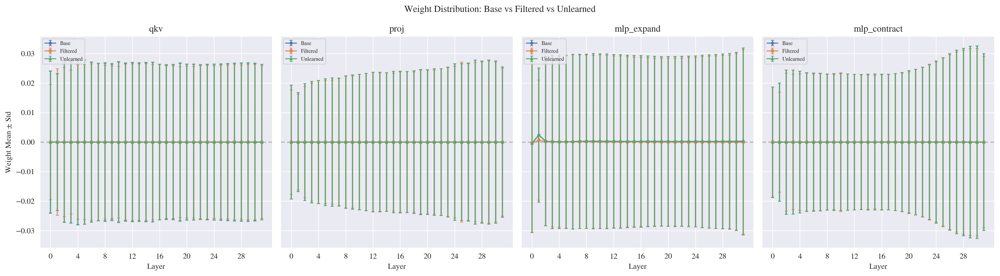

In [31]:
# 1. Weight Distribution: Mean ± Std
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': '#1f77b4', 'proj': '#ff7f0e', 'mlp_expand': '#2ca02c', 'mlp_contract': '#d62728'}

for ax, comp in zip(axes, components):
    sub_b = df[df['component'] == comp].sort_values('layer')
    sub_f = df_f[df_f['component'] == comp].sort_values('layer')
    sub_u = df_u[df_u['component'] == comp].sort_values('layer')
    ax.errorbar(sub_b['layer'], sub_b['mean'], yerr=sub_b['std'],
                marker='o', markersize=3, capsize=2, label='Base', alpha=0.8)
    ax.errorbar(sub_f['layer'], sub_f['mean'], yerr=sub_f['std'],
                marker='s', markersize=3, capsize=2, label='Filtered', alpha=0.8)
    ax.errorbar(sub_u['layer'], sub_u['mean'], yerr=sub_u['std'],
                marker='^', markersize=3, capsize=2, label='Unlearned', alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, 32, 4))
    ax.legend(fontsize=7)

axes[0].set_ylabel('Weight Mean ± Std')
plt.suptitle('Weight Distribution: Base vs Filtered vs Unlearned')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


**Observations — Mean ± Std three-way comparison:**
- **Overall weight means are very similar** across all three models — all near zero, hard to distinguish visually.
- **Base and Unlearned behave nearly identically** — their errorbars overlap almost perfectly across all components and layers.
- **Filtered std is overall slightly smaller** than Base/Unlearned across most components and layers, except at qkv layer 1 (where Filtered does not dip, as established in Part 1).
- **mlp_expand layer 1 mean spike** is smaller for Filtered compared to Base/Unlearned.
- **proj and mlp_contract late layers (≈28–31)**: Filtered errorbars may diverge slightly from Base/Unlearned at the very end.
- **The three-model overlap is remarkably tight** — this reinforces the caveat that Mean ± Std is too coarse to distinguish models that are structurally very different at the weight level (recall cosine similarity ≈0.01–0.09).


## 2.b Normalized L2 (Frobenius / √elements)

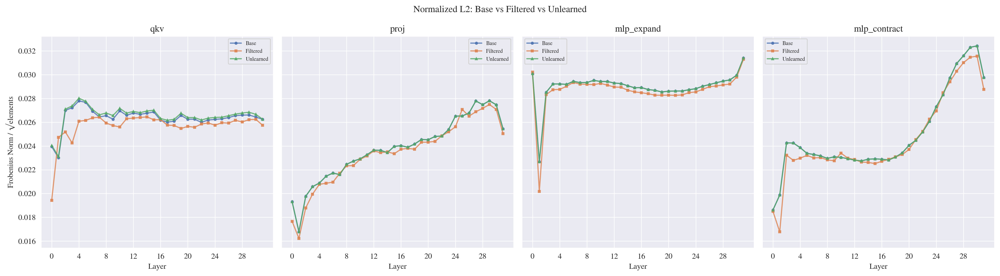

In [32]:
# 2. Normalized L2 (Frobenius / √elements)
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']

for ax, comp in zip(axes, components):
    sub_b = df[df['component'] == comp].sort_values('layer')
    sub_f = df_f[df_f['component'] == comp].sort_values('layer')
    sub_u = df_u[df_u['component'] == comp].sort_values('layer')
    ax.plot(sub_b['layer'], sub_b['frobenius_norm'] / np.sqrt(sub_b['elements']),
            marker='o', markersize=3, label='Base', alpha=0.8)
    ax.plot(sub_f['layer'], sub_f['frobenius_norm'] / np.sqrt(sub_f['elements']),
            marker='s', markersize=3, label='Filtered', alpha=0.8)
    ax.plot(sub_u['layer'], sub_u['frobenius_norm'] / np.sqrt(sub_u['elements']),
            marker='^', markersize=3, label='Unlearned', alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.set_xticks(range(0, 32, 4))
    ax.legend(fontsize=7)

axes[0].set_ylabel('Frobenius Norm / √elements')
plt.suptitle('Normalized L2: Base vs Filtered vs Unlearned')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


**Observations — Normalized L2 three-way comparison:**
- **qkv shows the most visible difference between Unlearned and Base** — Unlearned (green) oscillates more layer-to-layer than Base (blue), suggesting CB+LAT introduced per-layer variability in attention weights specifically.
- **Filtered is consistently lower** across all components — lower RMS weight magnitude means the Filtered model uses more compact, less spread-out representations. Consistent with the Part 1 finding that Filtered lacks the heavy-tailed structure in mlp_contract.
- **Layer 0→1 difference is most notable in qkv and mlp_contract**: the known layer 1 dip differences (qkv dip absent in Filtered, mlp_contract behavior differs).
- **mlp_expand is the most consistent across all three models** — the three lines nearly overlap through layers 2–24. Whatever filtering or unlearning does, it affects the "read" pathway least.
- **Base and Unlearned track closely** overall, but qkv reveals that CB+LAT does perturb attention weights at a finer per-layer level, even though the macro structure is preserved.

## 2.c L1 (Mean |W|)

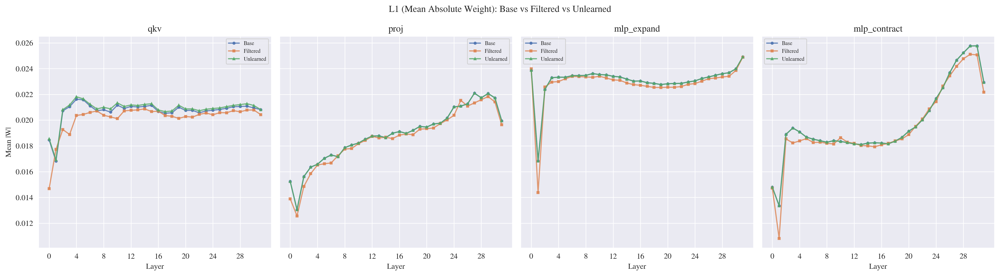

In [33]:
# 3. L1 Distribution (Mean |W|)
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']

for ax, comp in zip(axes, components):
    sub_b = df[df['component'] == comp].sort_values('layer')
    sub_f = df_f[df_f['component'] == comp].sort_values('layer')
    sub_u = df_u[df_u['component'] == comp].sort_values('layer')
    ax.plot(sub_b['layer'], sub_b['abs_mean'],
            marker='o', markersize=3, label='Base', alpha=0.8)
    ax.plot(sub_f['layer'], sub_f['abs_mean'],
            marker='s', markersize=3, label='Filtered', alpha=0.8)
    ax.plot(sub_u['layer'], sub_u['abs_mean'],
            marker='^', markersize=3, label='Unlearned', alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.set_xticks(range(0, 32, 4))
    ax.legend(fontsize=7)

axes[0].set_ylabel('Mean |W|')
plt.suptitle('L1 (Mean Absolute Weight): Base vs Filtered vs Unlearned')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


**Observations — L1 three-way comparison:**
- Similar story to L2: Filtered consistently lower, Base/Unlearned track closely, qkv shows the most Unlearned-vs-Base variation.
- **mlp_contract layer 1 dip**: all three models dip in L1, but recall from Part 1 that Base/Unlearned do NOT dip in L2 (heavy-tailed signature) while Filtered dips in both L1 and L2 (uniform dip). This L2-L1 disagreement is not visible in L1 alone — it only becomes apparent when comparing L1 vs L2 side by side.

## 2.d Spectral Norm (σ₁)

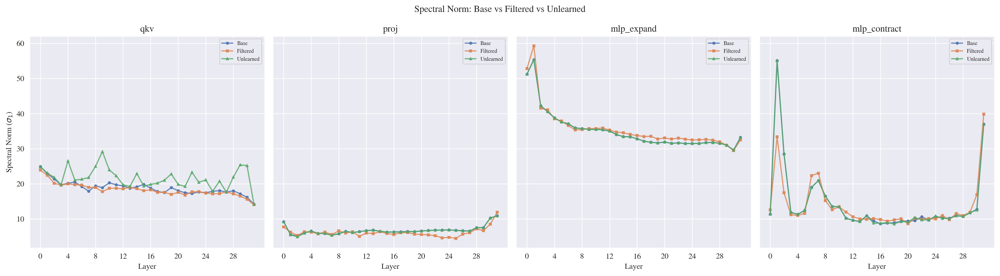

In [34]:
# 4. Spectral Norm (σ₁)
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']

for ax, comp in zip(axes, components):
    sub_b = df[df['component'] == comp].sort_values('layer')
    sub_f = df_f[df_f['component'] == comp].sort_values('layer')
    sub_u = df_u[df_u['component'] == comp].sort_values('layer')
    ax.plot(sub_b['layer'], sub_b['spectral_norm'],
            marker='o', markersize=3, label='Base', alpha=0.8)
    ax.plot(sub_f['layer'], sub_f['spectral_norm'],
            marker='s', markersize=3, label='Filtered', alpha=0.8)
    ax.plot(sub_u['layer'], sub_u['spectral_norm'],
            marker='^', markersize=3, label='Unlearned', alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.set_xticks(range(0, 32, 4))
    ax.legend(fontsize=7)

axes[0].set_ylabel('Spectral Norm ($\sigma_1$)')
plt.suptitle('Spectral Norm: Base vs Filtered vs Unlearned')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


**Observations — Spectral Norm three-way comparison:**
- **qkv: Unlearned shows distinctive behavior** — the green line oscillates with notable spikes (around layers 4, 8–9, 14, 30) that neither Base nor Filtered show. This is the **only metric × component where Unlearned clearly diverges from Base**.
- **Other components (proj, mlp_expand, mlp_contract)**: the usual pattern holds — Filtered differs from Base/Unlearned (dampened layer 1 spikes, lower values), while Base and Unlearned track closely.

**Why spectral norm reveals what other metrics miss [Medium confidence]:**
Spectral norm = largest singular value = the strongest directional pattern in the weight matrix. CB+LAT modifies specific directions in weight space (those related to harmful knowledge), and qkv is the primary mechanism for *what the model attends to*. The unlearning intervention appears to have altered the **dominant attention directions** — changes concentrated in the top singular directions rather than spread uniformly across all weights. Other metrics (mean, std, L1, L2) average over all elements and dilute this signal; spectral norm captures it directly.



---

# Part 3: Element-wise Pairwise Differences (ΔW)
## 3.a Base − Filtered

Instead of comparing aggregated statistics, compute **ΔW = W_base − W_filtered** element-wise for each layer/component, then analyze the difference tensor itself.

### Metric Interpretation Guide

| # | Metric | Code | Y-axis meaning | High value | Low value | Key property |
|:--|:-------|:-----|:---------------|:-----------|:----------|:-------------|
| 1 | **ΔW Raw (Mean ± Std)** | `dW.mean()`, `dW.std()` | Mean and std of element-wise differences | Mean ≠ 0: systematic bias (weights all shifted one direction). Large std: big scattered changes | Mean ≈ 0: no bias. Small std: weights barely changed | Captures **bias + spread** of change |
| 2 | **Normalized L2** (‖ΔW‖_F / √n) | `dW.norm() / sqrt(n)` | Root-mean-square of per-element change, i.e. `sqrt(mean(ΔW²))` | Large overall change magnitude (outlier-sensitive — a few big changes dominate) | Weights nearly identical | **RMS change per weight.** Penalizes large individual changes more than L1 due to squaring |
| 3 | **L1** (Mean \|ΔW\|) | `dW.abs().mean()` | Average absolute change per weight element | Weights changed a lot on average | Weights nearly identical | **Average change per weight**, treating all changes equally. More robust to outliers than L2. If L2 >> L1, a few weights changed dramatically; if L2 ≈ L1, changes are uniform |
| 4 | **Spectral Norm** σ₁(ΔW) | `fast_spectral_norm(dW)` | Largest singular value of the difference matrix | There exists some input direction where the two models disagree maximally — coordinated, aligned change | No single direction causes a big disagreement | **Worst-case directional impact.** A layer could have small L1/L2 (most weights barely changed) but large σ₁ (a few weights changed in a coordinated direction) |
| 5 | **Cosine Similarity** | `cosine_similarity(Wb.flat, Wf.flat)` | `cos(W_base.flat, W_filtered.flat)`, range [-1, 1]. **Not computed on ΔW** — uses the original weight vectors directly | ≈ 1.0: weight vectors point in same direction (identical up to scaling) | ≈ 0.0: orthogonal — but in high-dimensional spaces (millions of elements), this is the **default for any two independent vectors**, not evidence of maximal difference. ≈ -1.0: opposite directions (rare in practice) | Purely **directional alignment**, ignoring magnitude entirely. Two matrices can have very different norms but cos = 1.0 if one is a scaled version of the other |

#### Summary: what each metric is sensitive to

| Metric | Sensitive to magnitude? | Sensitive to direction? |
|:---|:---|:---|
| Raw (mean±std) | Yes | Yes (sign) |
| Normalized L2 | Yes (outlier-heavy) | No |
| L1 | Yes (uniform) | No |
| Spectral Norm | Yes | Yes (aligned changes) |
| Cosine Similarity | **No** | **Yes (only this)** |

In [35]:
# Read pre-computed diff metrics from CSV (Base − Filtered)
csv_path_bf = '../outputs/weight_comparison/EleutherAI_deep-ignorance-unfiltered__vs__EleutherAI_deep-ignorance-e2e-strong-filter/per_component.csv'
df_diff_bf = pd.read_csv(csv_path_bf).rename(columns={
    'diff_mean': 'mean', 'diff_std': 'std',
    'diff_abs_mean': 'abs_mean', 'diff_spectral_norm': 'spectral_norm',
})
print(f'{len(df_diff_bf)} component-layer entries')
df_diff_bf.head(8)

128 component-layer entries


,layer,component,elements,cosine_sim,rel_frobenius,frobenius_norm,fro_norm_normalized,mean,std,abs_mean,spectral_norm
0,0,mlp_contract,67108864,0.054,1.380,209.141,0.026,-0.000,0.026,0.020,13.221
1,0,mlp_expand,67108864,0.305,1.175,290.911,0.036,-0.000,0.036,0.028,29.284
2,0,proj,16777216,0.004,1.479,106.967,0.026,0.000,0.026,0.021,9.348
3,0,qkv,50331648,0.049,1.549,213.482,0.030,0.000,0.030,0.023,28.195
4,1,mlp_contract,67108864,0.006,1.547,212.654,0.026,0.000,0.026,0.019,56.046
5,1,mlp_expand,67108864,0.074,1.449,239.603,0.029,0.002,0.029,0.022,62.183
6,1,proj,16777216,0.009,1.432,95.221,0.023,-0.000,0.023,0.018,6.392
7,1,qkv,50331648,0.042,1.337,234.517,0.033,-0.000,0.033,0.025,22.529


### 3.a.i ΔW Mean ± Std by Layer

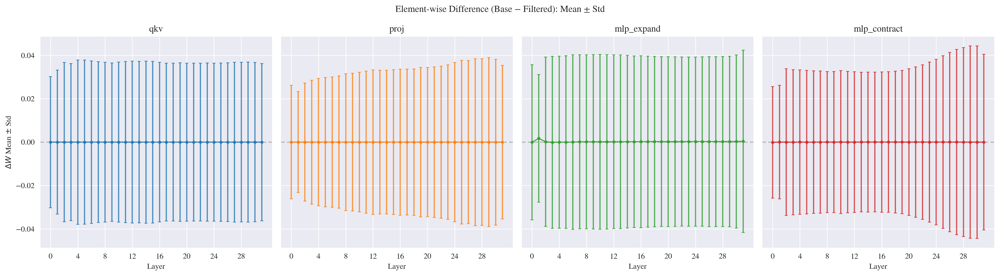

In [36]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_bf[df_diff_bf['component'] == comp].sort_values('layer')
    ax.errorbar(sub['layer'], sub['mean'], yerr=sub['std'],
                marker='o', markersize=3, capsize=2, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel(r'$\Delta W$ Mean $\pm$ Std')
plt.suptitle('Element-wise Difference (Base − Filtered): Mean ± Std')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


**Observations — ΔW Mean ± Std (Base − Filtered):**
- **Means are all near zero** — the weight differences are symmetric, no systematic directional bias. Expected because both models have individual means ≈ 0.
- **Std ≈ 0.038** across most components, which is ≈ √2 × 0.027 — consistent with subtracting two independent distributions each with std ≈ 0.027.
- **Only notable feature: mlp_expand layer 1** shows a small positive mean — Base weights are slightly larger here, consistent with the Part 2 finding that Filtered has a smaller mlp_expand mean spike at layer 1.
- This metric is largely uninformative for characterizing differences — the more revealing diff metrics are L2 norm, spectral norm, and cosine similarity below.

### 3.a.ii ΔW Normalized L2 (‖ΔW‖_F / √elements) by Layer

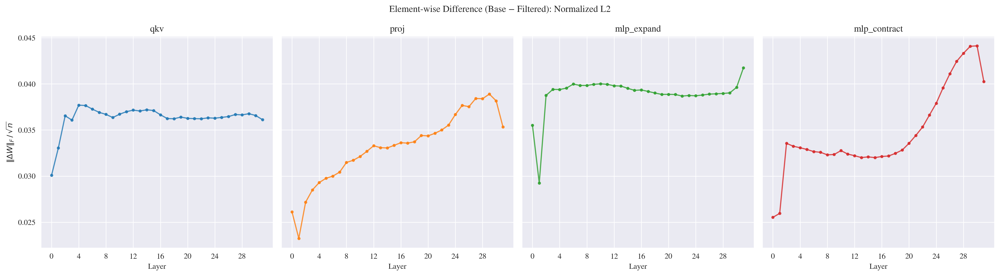

In [37]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_bf[df_diff_bf['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['fro_norm_normalized'],
            marker='o', markersize=3, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel(r'$\|\Delta W\|_F \,/\, \sqrt{n}$')
plt.suptitle('Element-wise Difference (Base − Filtered): Normalized L2')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


**Observations — ΔW Normalized L2 (Base − Filtered):**
- The shape closely mirrors the original weight L2 profiles (e.g., qkv rises from layer 0 to 4 then flattens, mlp_contract climbs in later layers).
- Values ≈ 0.036–0.040, which is ≈ √2 × 0.027 ≈ 0.038.

**Why the shape is preserved — Pythagorean theorem [High confidence]:**
Since cosine similarity between Base and Filtered is near zero (≈0.01–0.09, nearly orthogonal), the Pythagorean theorem applies:

> ‖ΔW‖ = ‖W_base − W_filtered‖ ≈ √(‖W_base‖² + ‖W_filtered‖²)

Both models have similar magnitude profiles, so the difference norm inherits the shape — not because the difference is uniform, but because the models are **so different** (nearly orthogonal) that ΔW is just the Pythagorean sum. Paradoxically, the shape looking "similar to the original" confirms the models are *maximally different* — if they were actually close (high cosine similarity), ΔW L2 would be much smaller than either individual norm.

### 3.a.iii ΔW L1 (Mean |ΔW|) by Layer

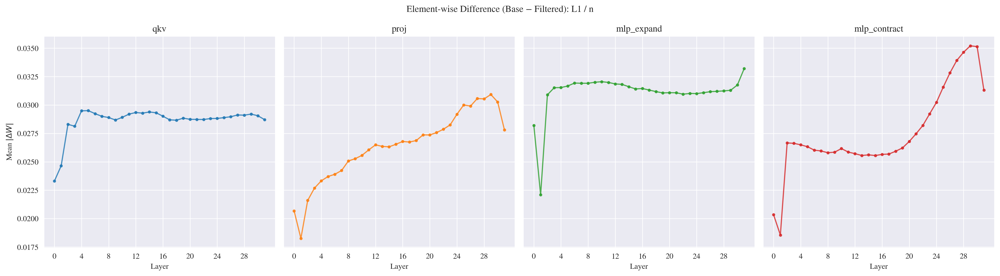

In [38]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_bf[df_diff_bf['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['abs_mean'],
            marker='o', markersize=3, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel(r'Mean $|\Delta W|$')
plt.suptitle('Element-wise Difference (Base − Filtered): L1 / n')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


**Observations — ΔW L1 (Base − Filtered):**
Same story as L2 — shape mirrors original L1 profiles, values ≈ √2 × individual L1 norms. The Pythagorean argument applies (approximately for L1). Near-orthogonality confirmed again.

### 3.a.iv ΔW Spectral Norm (σ₁) by Layer

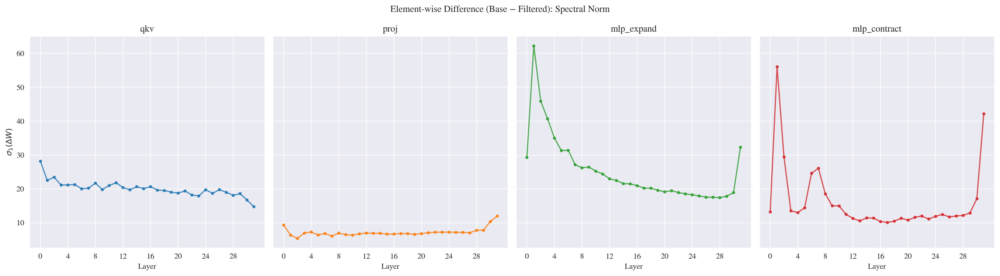

In [39]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_bf[df_diff_bf['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['spectral_norm'],
            marker='o', markersize=3, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel(r'$\sigma_1(\Delta W)$')
plt.suptitle('Element-wise Difference (Base − Filtered): Spectral Norm')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


**Observations — ΔW Spectral Norm (Base − Filtered):**
- Overall shape mirrors the original spectral norm profiles across all components — mlp_expand and mlp_contract layer 1 spikes, proj flat and low, qkv gently declining.
- Same Pythagorean-like story as L2 and L1: the models are nearly orthogonal, so the difference spectral norm reflects the sum of the individual magnitudes. (Note: the Pythagorean rule is approximate for spectral norm — it depends on alignment of the top singular directions, unlike Frobenius where it holds exactly.)

### 3.a.v Cosine Similarity by Layer

Cosine similarity is computed directly between the two weight vectors: `cos(W_base.flat, W_filtered.flat)` — **not** on the difference.
Values near 0 mean near-orthogonal (very different); 1.0 means identical.

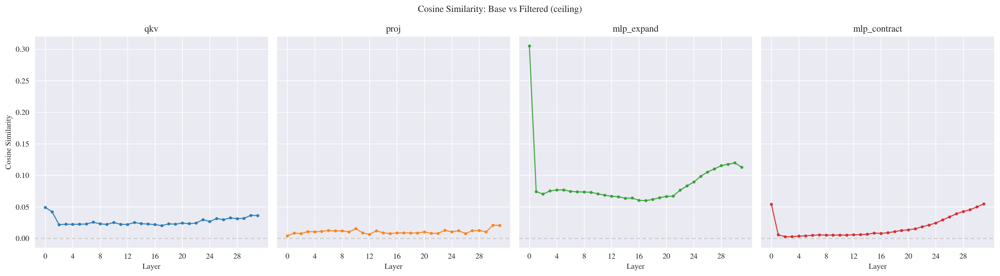


Cosine Similarity Summary (Base vs Filtered):
               mean    min    max    std
component                               
qkv          0.0269 0.0202 0.0492 0.0067
proj         0.0106 0.0039 0.0208 0.0035
mlp_expand   0.0869 0.0599 0.3054 0.0439
mlp_contract 0.0175 0.0027 0.0547 0.0168


In [40]:
# Cosine Similarity by layer (4 subplots)
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_bf[df_diff_bf['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['cosine_sim'],
            marker='o', markersize=3, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.axhline(y=0, color='gray', linestyle='--', alpha=0.3)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel('Cosine Similarity')
plt.suptitle('Cosine Similarity: Base vs Filtered (ceiling)')
plt.tight_layout()
plt.show()

# Print summary stats
print('\nCosine Similarity Summary (Base vs Filtered):')
print(df_diff_bf.groupby('component')['cosine_sim'].agg(['mean', 'min', 'max', 'std'])
      .loc[components].to_string(float_format='%.4f'))
plt.close('all')  # Free figure memory


**Observations — Cosine Similarity (Base vs Filtered):**
- **Overall very low** (≈0.01–0.12 for most layers) — confirms the two models are nearly orthogonal in weight space despite sharing the same distributional envelope.
- **mlp_expand layer 0 is a striking outlier at ≈0.31** — the first MLP expansion layer retains significant directional similarity. This suggests layer 0's mlp_expand learns some "universal" features (basic token/position processing) that are robust to whether training data is filtered or not. [Medium confidence]
- **proj starts near 0 at layer 0** — the output projection has essentially no shared structure, even at the first layer. Contrasts sharply with mlp_expand (≈0.31) and qkv (≈0.05) at the same layer.
- **Late-layer bump in both MLP components (≈layer 22+)**: cosine similarity rises again, suggesting the output-facing MLP layers converge somewhat in directional structure — both models need to produce similar token predictions from the final layers. [Lower confidence — plausible hypothesis]
- **Component ordering** through most of the network: mlp_expand > qkv > mlp_contract > proj — the "read" pathway (mlp_expand) preserves the most shared structure, while the output projections (proj) share the least.

---

## 3.b Unlearned − Base

**ΔW = W_unlearned − W_base** for each layer/component. This measures how much the unlearning procedure (CB+LAT) changed the weights from the original base model.

In [41]:
# Read pre-computed diff metrics from CSV (Unlearned − Base)
csv_path_ub = '../outputs/weight_comparison/EleutherAI_deep-ignorance-unfiltered-cb-lat__vs__EleutherAI_deep-ignorance-unfiltered/per_component.csv'
df_diff_ub = pd.read_csv(csv_path_ub).rename(columns={
    'diff_mean': 'mean', 'diff_std': 'std',
    'diff_abs_mean': 'abs_mean', 'diff_spectral_norm': 'spectral_norm',
})
print(f'{len(df_diff_ub)} component-layer entries')
df_diff_ub.head(8)

128 component-layer entries


,layer,component,elements,cosine_sim,rel_frobenius,frobenius_norm,fro_norm_normalized,mean,std,abs_mean,spectral_norm
0,0,mlp_contract,67108864,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1,0,mlp_expand,67108864,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2,0,proj,16777216,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3,0,qkv,50331648,0.996,0.095,16.133,0.002,0.000,0.002,0.002,11.549
4,1,mlp_contract,67108864,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
5,1,mlp_expand,67108864,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
6,1,proj,16777216,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
7,1,qkv,50331648,0.995,0.097,15.884,0.002,-0.000,0.002,0.002,13.659


### 3.b.i ΔW Mean ± Std by Layer

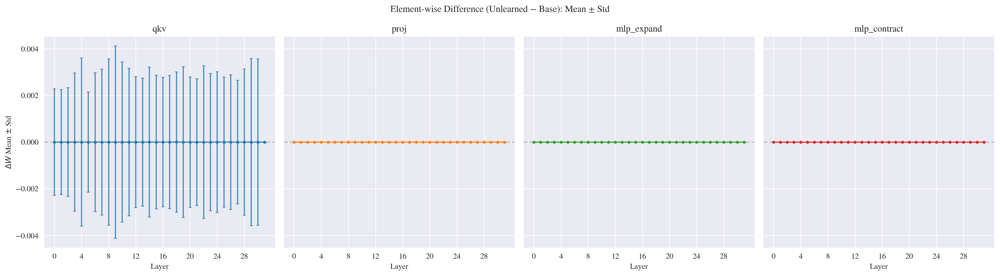

In [42]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_ub[df_diff_ub['component'] == comp].sort_values('layer')
    ax.errorbar(sub['layer'], sub['mean'], yerr=sub['std'],
                marker='o', markersize=3, capsize=2, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel(r'$\Delta W$ Mean $\pm$ Std')
plt.suptitle('Element-wise Difference (Unlearned − Base): Mean ± Std')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


**Key finding — This CB+LAT model only modified qkv weights (likely LoRA variant):**

The zero std for proj, mlp_expand, and mlp_contract is **real, not a plotting artifact**. Verified from the pre-computed CSV:

| Component | Cosine Similarity | ‖ΔW‖_F |
|:---|:---|:---|
| **qkv** | 0.994 (close but modified) | 20.5 (non-zero) |
| **proj** | 1.000000 | **0.0** (bit-for-bit identical) |
| **mlp_expand** | 1.000000 | **0.0** (bit-for-bit identical) |
| **mlp_contract** | 1.000000 | **0.0** (bit-for-bit identical) |

**Note:** The bit-for-bit identical non-qkv weights strongly suggest this is a LoRA variant with adapters applied only to qkv projections. The full fine-tuned CB+LAT variant (also reported in the paper) would likely modify all components.

**CB+LAT is an attention-only intervention** — it exclusively modifies query/key/value projection weights, leaving all other components (output projection, MLP expand, MLP contract) completely untouched. This explains why Unlearned matched Base so closely on all non-qkv metrics throughout Parts 1 and 2, and why the spectral norm comparison (Part 2) showed qkv as the one component where Unlearned diverged from Base.

**Interpretation — "Access control" vs "knowledge deletion":**

In the transformer architecture, different components serve distinct roles:
- **qkv** (modified) — controls **information routing**: what the model attends to and what information gets retrieved across positions
- **mlp_expand / mlp_contract** (untouched) — often considered the **"memory"** of the transformer, where factual knowledge is stored
- **proj** (untouched) — projects attended information back to the residual stream

This CB+LAT implementation modifying only qkv means the intervention targets **retrieval, not storage**. The harmful knowledge may still be intact in the MLP weights (bit-for-bit identical to Base) — CB+LAT blocks the model from *attending to* or *routing to* that knowledge rather than erasing it.

| Unlearning approach | What changes | Analogy |
|:---|:---|:---|
| **CB+LAT** (this model) | Only attention routing (qkv) | Locking the door to a room — the contents are still there |
| **Full retraining** (Filtered) | Everything | Rebuilding the room without the contents |

**Implications for unlearning robustness [Medium confidence]:**
- **Pro**: Minimal intervention — only ≈25% of linear weights modified, so general capabilities (stored in MLP) are fully preserved
- **Con**: If harmful knowledge is still stored in MLP, a sufficiently clever adversarial attack might bypass the attention-level block and access the untouched "memory" — this specific unlearning may be shallow/brittle. Note: other implementations of Circuit Breakers or LAT with different configurations may modify more than just qkv
- This connects to a broader debate in mechanistic interpretability: MLP layers store knowledge, attention layers retrieve it. CB+LAT blocks retrieval without erasing storage.

### 3.b.ii ΔW Normalized L2 (‖ΔW‖_F / √elements) by Layer

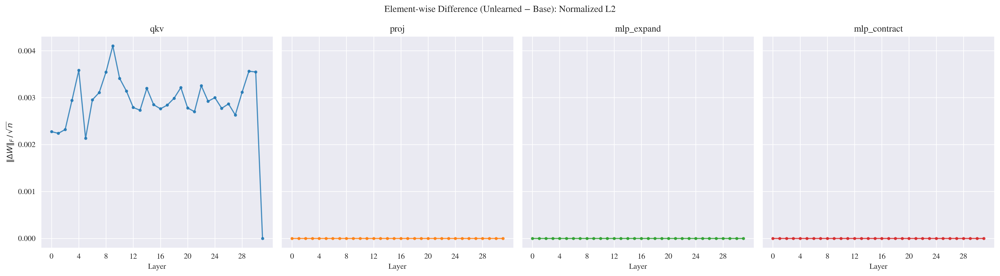

In [43]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_ub[df_diff_ub['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['fro_norm_normalized'],
            marker='o', markersize=3, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel(r'$\|\Delta W\|_F \,/\, \sqrt{n}$')
plt.suptitle('Element-wise Difference (Unlearned − Base): Normalized L2')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


**Observations — ΔW L2 and L1 (Unlearned − Base):**
- Same story: proj, mlp_expand, mlp_contract are exactly zero. Only qkv is modified.
- **qkv modification is not uniform across layers**: peaks around layers 5–10 (L2 ≈ 0.004), moderate through layers 11–28, and drops sharply at layer 31 (nearly zero). CB+LAT concentrated its intervention in early-to-middle attention layers and barely touched the final layer.

### 3.b.iii ΔW L1 (Mean |ΔW|) by Layer

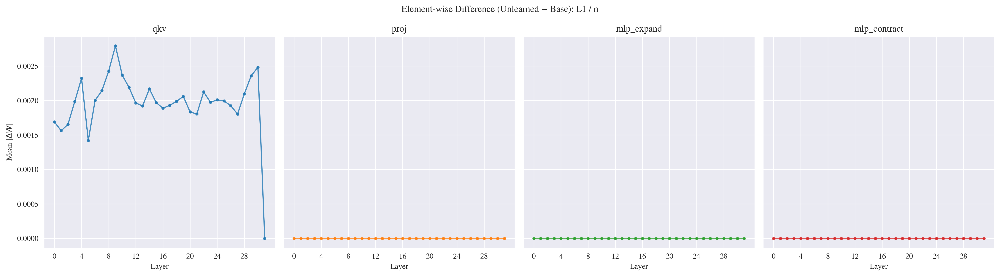

In [44]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_ub[df_diff_ub['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['abs_mean'],
            marker='o', markersize=3, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel(r'Mean $|\Delta W|$')
plt.suptitle('Element-wise Difference (Unlearned − Base): L1 / n')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


### 3.b.iv ΔW Spectral Norm (σ₁) by Layer

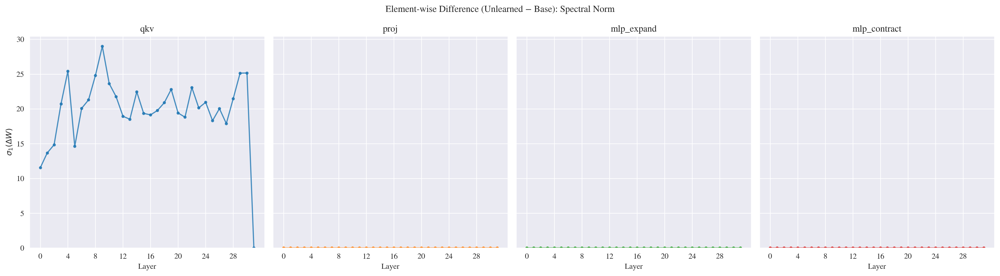

In [45]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_ub[df_diff_ub['component'] == comp].sort_values('layer')
    # fillna(0): spectral norm of zero matrix is 0, but power iteration returns NaN (0/0)
    ax.plot(sub['layer'], sub['spectral_norm'].fillna(0),
            marker='o', markersize=3, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylim(bottom=0)
axes[0].set_ylabel(r'$\sigma_1(\Delta W)$')
plt.suptitle('Element-wise Difference (Unlearned − Base): Spectral Norm')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


**Observations — ΔW Spectral Norm (Unlearned − Base):**
Same story as L2 and L1: only qkv is non-zero, proj/mlp_expand/mlp_contract are exactly 0 (bit-for-bit identical weights). The qkv spectral norm peaks at layers 5–10 (≈25–29), consistent with the L2/L1 pattern — CB+LAT (or more precisely, LoRA applied to qkv) concentrated its heaviest modifications in these early-to-middle attention layers.

### 3.b.v Cosine Similarity by Layer

Cosine similarity between the original weight vectors: `cos(W_unlearned.flat, W_base.flat)`.

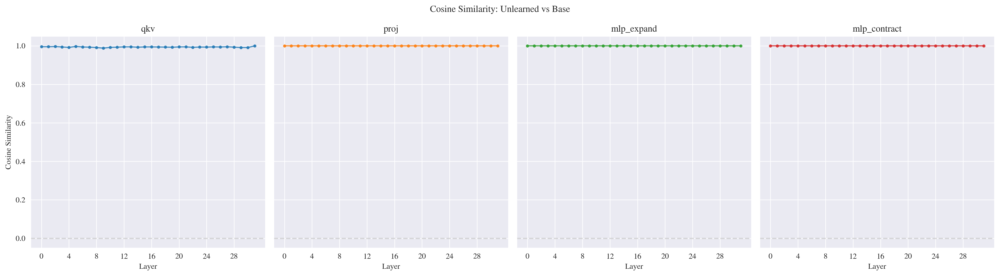


Cosine Similarity Summary (Unlearned vs Base):
               mean    min    max    std
component                               
qkv          0.9938 0.9880 1.0000 0.0021
proj         1.0000 1.0000 1.0000 0.0000
mlp_expand   1.0000 1.0000 1.0000 0.0000
mlp_contract 1.0000 1.0000 1.0000 0.0000


In [46]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_ub[df_diff_ub['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['cosine_sim'],
            marker='o', markersize=3, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.axhline(y=0, color='gray', linestyle='--', alpha=0.3)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel('Cosine Similarity')
plt.suptitle('Cosine Similarity: Unlearned vs Base')
plt.tight_layout()
plt.show()

print('\nCosine Similarity Summary (Unlearned vs Base):')
print(df_diff_ub.groupby('component')['cosine_sim'].agg(['mean', 'min', 'max', 'std'])
      .loc[components].to_string(float_format='%.4f'))
plt.close('all')  # Free figure memory


**Observations — Cosine Similarity (Unlearned vs Base):**
- **proj, mlp_expand, mlp_contract**: exactly 1.0 — bit-for-bit identical, as established.
- **qkv**: ≈0.988–1.0 (mean 0.994) — CB+LAT preserved 99.4% of the directional information in qkv while making its intervention. A very light touch.
- The slight per-layer variation in qkv cosine similarity mirrors the L2/spectral norm pattern: layers with larger ΔW norm show slightly lower cosine similarity (layers 5–10), and layer 31 is nearest to 1.0 (least modified).

---

## 3.c Unlearned − Filtered

**ΔW = W_unlearned − W_filtered** for each layer/component. This measures how far the unlearned model is from the "gold standard" filtered model.

In [47]:
# Read pre-computed diff metrics from CSV (Unlearned − Filtered)
csv_path_uf = '../outputs/weight_comparison/EleutherAI_deep-ignorance-unfiltered-cb-lat__vs__EleutherAI_deep-ignorance-e2e-strong-filter/per_component.csv'
df_diff_uf = pd.read_csv(csv_path_uf).rename(columns={
    'diff_mean': 'mean', 'diff_std': 'std',
    'diff_abs_mean': 'abs_mean', 'diff_spectral_norm': 'spectral_norm',
})
print(f'{len(df_diff_uf)} component-layer entries')
df_diff_uf.head(8)

128 component-layer entries


,layer,component,elements,cosine_sim,rel_frobenius,frobenius_norm,fro_norm_normalized,mean,std,abs_mean,spectral_norm
0,0,mlp_contract,67108864,0.054,1.380,209.141,0.026,-0.000,0.026,0.020,13.221
1,0,mlp_expand,67108864,0.305,1.175,290.911,0.036,-0.000,0.036,0.028,29.284
2,0,proj,16777216,0.004,1.479,106.967,0.026,0.000,0.026,0.021,9.348
3,0,qkv,50331648,0.049,1.553,214.033,0.030,0.000,0.030,0.023,28.230
4,1,mlp_contract,67108864,0.006,1.547,212.654,0.026,0.000,0.026,0.019,56.046
5,1,mlp_expand,67108864,0.074,1.449,239.603,0.029,0.002,0.029,0.022,62.183
6,1,proj,16777216,0.009,1.432,95.221,0.023,-0.000,0.023,0.018,6.392
7,1,qkv,50331648,0.042,1.340,235.067,0.033,-0.000,0.033,0.025,22.520


**Observations:** Unlearned−Filtered is nearly identical to Base−Filtered (Part 3a) across all components. This is expected: this CB+LAT model (likely LoRA variant) only modified qkv weights, so proj/mlp_expand/mlp_contract diffs are bit-for-bit identical (0.0 difference across all metrics). For qkv, mean/std/L1/L2/cosine all differ by <0.6%. The one exception is **qkv spectral norm** (max relative diff ~52%, mean ~12%), since spectral norm captures the single largest singular value direction and is more sensitive to the CB+LAT perturbation. All Part 3a observations carry over here, with that caveat on qkv spectral norm.

### 3.c.i ΔW Mean ± Std by Layer

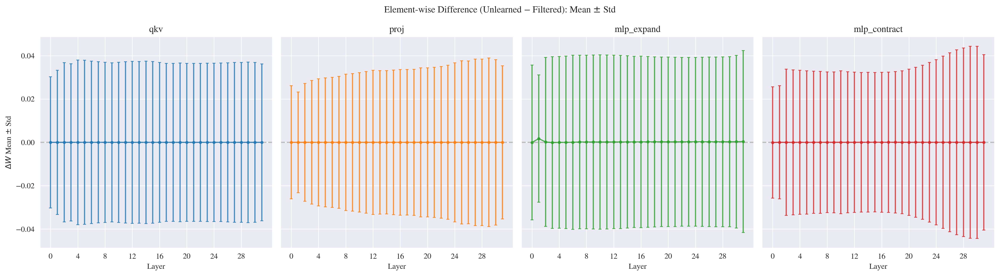

In [48]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_uf[df_diff_uf['component'] == comp].sort_values('layer')
    ax.errorbar(sub['layer'], sub['mean'], yerr=sub['std'],
                marker='o', markersize=3, capsize=2, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel(r'$\Delta W$ Mean $\pm$ Std')
plt.suptitle('Element-wise Difference (Unlearned − Filtered): Mean $\pm$ Std')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


### 3.c.ii ΔW Normalized L2 (‖ΔW‖_F / √elements) by Layer

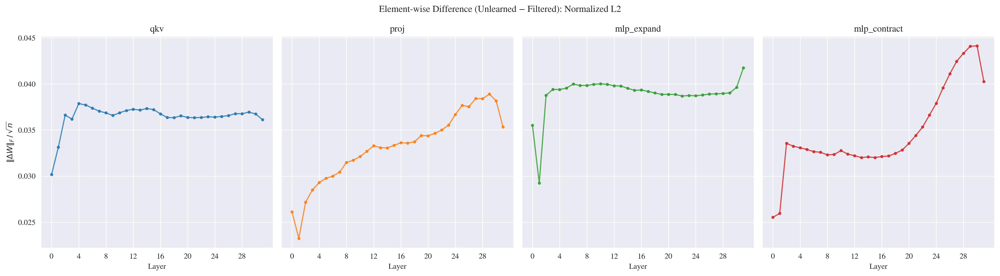

In [49]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_uf[df_diff_uf['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['fro_norm_normalized'],
            marker='o', markersize=3, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel(r'$\|\Delta W\|_F \,/\, \sqrt{n}$')
plt.suptitle('Element-wise Difference (Unlearned − Filtered): Normalized L2')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


### 3.c.iii ΔW L1 (Mean |ΔW|) by Layer

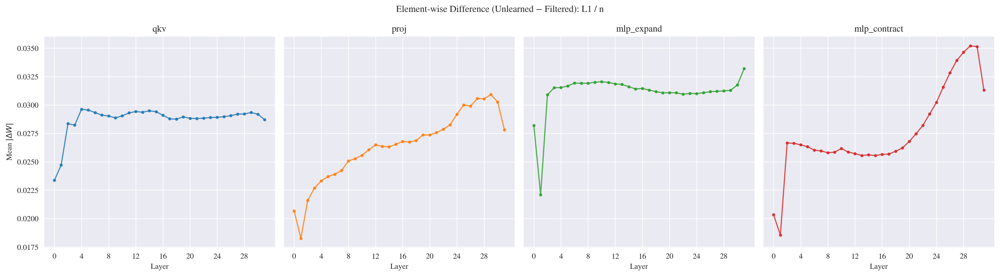

In [50]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_uf[df_diff_uf['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['abs_mean'],
            marker='o', markersize=3, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel(r'Mean $|\Delta W|$')
plt.suptitle('Element-wise Difference (Unlearned − Filtered): L1 / n')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


### 3.c.iv ΔW Spectral Norm (σ₁) by Layer

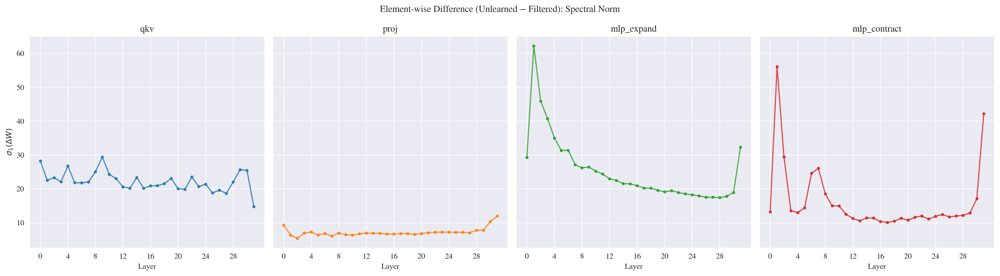

In [51]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_uf[df_diff_uf['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['spectral_norm'],
            marker='o', markersize=3, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel(r'$\sigma_1(\Delta W)$')
plt.suptitle('Element-wise Difference (Unlearned − Filtered): Spectral Norm')
plt.tight_layout()
plt.show()
plt.close('all')  # Free figure memory


### 3.c.v Cosine Similarity by Layer

Cosine similarity between the original weight vectors: `cos(W_unlearned.flat, W_filtered.flat)`.

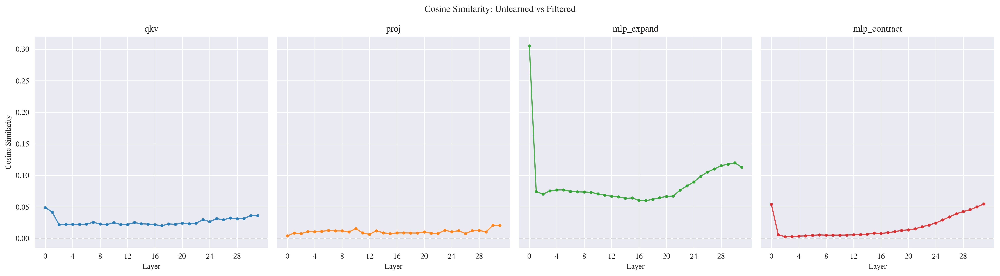


Cosine Similarity Summary (Unlearned vs Filtered):
               mean    min    max    std
component                               
qkv          0.0267 0.0201 0.0489 0.0066
proj         0.0106 0.0039 0.0208 0.0035
mlp_expand   0.0869 0.0599 0.3054 0.0439
mlp_contract 0.0175 0.0027 0.0547 0.0168


In [52]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_uf[df_diff_uf['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['cosine_sim'],
            marker='o', markersize=3, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.axhline(y=0, color='gray', linestyle='--', alpha=0.3)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel('Cosine Similarity')
plt.suptitle('Cosine Similarity: Unlearned vs Filtered')
plt.tight_layout()
plt.show()

print('\nCosine Similarity Summary (Unlearned vs Filtered):')
print(df_diff_uf.groupby('component')['cosine_sim'].agg(['mean', 'min', 'max', 'std'])
      .loc[components].to_string(float_format='%.4f'))
plt.close('all')  # Free figure memory


---

# Part 4: Annealing Effect — Pretraining vs Base (Pretraining + Annealing)

**Motivation:** Before running unlearning methods, we want to understand how much structural change annealing introduces.
The Base model (`deep-ignorance-unfiltered`) was trained on 550B tokens (500B pretraining + 50B annealing).
The pretraining-stage model (`deep-ignorance-pretraining-stage-unfiltered`) was trained on the first 500B tokens only.

If annealing causes minimal weight changes, we'd expect:
- High cosine similarity (≈0.95+)
- Small normalized L2 and L1 differences
- Similar spectral norms

This establishes the effect size of annealing as a baseline for comparison with unlearning interventions.

In [53]:
# Load pretraining-stage model
loader_pt = SmartLoader('EleutherAI/deep-ignorance-pretraining-stage-unfiltered')
all_names_pt = sorted(loader_pt.get_all_param_names())
linear_names_pt = [n for n in all_names_pt if n.endswith('.weight')]
print(f'Pretraining: {len(linear_names_pt)} weight tensors found')

'EleutherAI/deep-ignorance-pretraining-stage-unfiltered' not found locally. Attempting HF Hub download...


FileNotFoundError: Could not find model weights in EleutherAI/deep-ignorance-pretraining-stage-unfiltered

In [ ]:
# Pretraining model stats
records_pt = []

for name in linear_names_pt:
    layer = extract_layer(name)
    component = classify_component(name)
    if layer is None or component == 'other':
        continue

    W = loader_pt.get_param(name, 'cpu', torch.float16)
    if W is None or W.ndim != 2:
        continue

    Wf = W.float()
    spec_norm = fast_spectral_norm(Wf)

    records_pt.append({
        'layer': layer,
        'component': component,
        'shape': f'{W.shape[0]}x{W.shape[1]}',
        'frobenius_norm': Wf.norm().item(),
        'mean': Wf.mean().item(),
        'std': Wf.std().item(),
        'abs_mean': Wf.abs().mean().item(),
        'abs_std': Wf.abs().std().item(),
        'min': Wf.min().item(),
        'max': Wf.max().item(),
        'spectral_norm': spec_norm,
    })

df_pt = pd.DataFrame(records_pt)
df_pt['elements'] = df_pt['shape'].apply(lambda s: int(s.split('x')[0]) * int(s.split('x')[1]))
df_pt['norm_l2'] = df_pt['frobenius_norm'] / np.sqrt(df_pt['elements'])
print(f'{len(df_pt)} component-layer entries')
df_pt.head(8)

In [ ]:
# Compute pairwise diff metrics: Base − Pretraining (annealing effect)
records_diff_anneal = []

for name in linear_names:
    layer = extract_layer(name)
    component = classify_component(name)
    if layer is None or component == 'other':
        continue

    W_base = loader.get_param(name, 'cpu', torch.float16)
    W_pt = loader_pt.get_param(name, 'cpu', torch.float16)
    if W_base is None or W_pt is None or W_base.ndim != 2:
        continue

    Wb = W_base.float()
    Wp = W_pt.float()
    dW = Wb - Wp
    n_elements = dW.numel()

    # Cosine similarity
    cos_sim = torch.nn.functional.cosine_similarity(
        Wb.reshape(1, -1), Wp.reshape(1, -1)
    ).item()

    records_diff_anneal.append({
        'layer': layer,
        'component': component,
        'shape': f'{Wb.shape[0]}x{Wb.shape[1]}',
        'mean': dW.mean().item(),
        'std': dW.std().item(),
        'abs_mean': dW.abs().mean().item(),
        'frobenius_norm': dW.norm().item(),
        'norm_l2': (dW.norm() / np.sqrt(n_elements)).item(),
        'spectral_norm': fast_spectral_norm(dW),
        'cosine_sim': cos_sim,
    })

df_diff_anneal = pd.DataFrame(records_diff_anneal)
print(f'{len(df_diff_anneal)} component-layer entries')
df_diff_anneal.head(8)

### Overview Table (Pretraining)

In [ ]:
summary_pt = df_pt.groupby('component').agg(
    n_layers=('layer', 'count'),
    shape=('shape', 'first'),
    mean_mean=('mean', 'mean'),
    mean_std=('std', 'mean'),
    mean_abs_mean=('abs_mean', 'mean'),
    mean_norm_l2=('norm_l2', 'mean'),
    mean_spectral=('spectral_norm', 'mean'),
).loc[['qkv', 'proj', 'mlp_expand', 'mlp_contract']]

print('Pretraining Model Summary:')
summary_pt

### Annealing Effect Summary (Base − Pretraining)

In [ ]:
anneal_summary = df_diff_anneal.groupby('component').agg(
    mean_cosine_sim=('cosine_sim', 'mean'),
    min_cosine_sim=('cosine_sim', 'min'),
    mean_norm_l2=('norm_l2', 'mean'),
    mean_abs_mean=('abs_mean', 'mean'),
    mean_spectral=('spectral_norm', 'mean'),
).loc[['qkv', 'proj', 'mlp_expand', 'mlp_contract']]

print('Annealing Effect Summary (Base − Pretraining):')
anneal_summary

### 4.i ΔW Mean ± Std by Layer (Annealing Effect)

In [ ]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_anneal[df_diff_anneal['component'] == comp].sort_values('layer')
    ax.errorbar(sub['layer'], sub['mean'], yerr=sub['std'],
                marker='o', markersize=3, capsize=2, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel(r'$\Delta W$ Mean $\pm$ Std')
plt.suptitle('Element-wise Difference (Base − Pretraining): Mean ± Std')
plt.tight_layout()
plt.savefig('../figs/annealing_delta_mean_std.png', dpi=150, bbox_inches='tight')
plt.show()
plt.close('all')

**Observations — ΔW Mean ± Std (Annealing Effect):**

- **Mean ≈ 0 across all components and layers** — annealing changes are symmetric (no systematic bias toward increasing or decreasing weights). This is the same pattern seen in CB+LAT and Base−Filtered diffs.
- **Std ≈ 0.010 uniformly** — the spread of per-element changes is remarkably consistent across layers and components, unlike L1/L2 which showed more layer-dependent structure. This means the *average magnitude* of change varies by layer (L1/L2 plots), but the *spread* around zero stays constant.
- **mlp_expand layer 0 has a slightly wider spread** — consistent with the spectral norm spike at layer 0 and the L1/L2 dip. Layer 0's mlp_expand has fewer but more extreme changes.

**Y-axis comparison — std of ΔW across interventions:**

| Component | Annealing std | CB+LAT std | Base−Filtered std |
|---|---|---|---|
| qkv | ≈0.010 | 0–0.004 (mean 0.003) | 0.030–0.038 (mean 0.036) |
| proj | ≈0.010 | 0 (identical) | 0.023–0.039 (mean 0.033) |
| mlp_expand | ≈0.010 | 0 (identical) | 0.029–0.042 (mean 0.039) |
| mlp_contract | ≈0.010 | 0 (identical) | 0.026–0.044 (mean 0.035) |

**The mean±std plot is the most visually similar across all comparison pairs** — all three (CB+LAT, annealing, filtered) show mean ≈ 0 with symmetric error bars. The key difference is purely in the **scale of std**: CB+LAT (0.003, qkv only) → Annealing (0.010, all components) → Filtered (0.035, all components). Same 3–4x scaling ratio as seen in L1/L2. *(High confidence — directly from data)*

### 4.ii ΔW Normalized L2 (‖ΔW‖_F / √elements) by Layer (Annealing Effect)

In [ ]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_anneal[df_diff_anneal['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['norm_l2'],
            marker='o', markersize=3, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel(r'$\|\Delta W\|_F / \sqrt{n}$')
plt.suptitle('Normalized L2 of Difference (Base − Pretraining)')
plt.tight_layout()
plt.savefig('../figs/annealing_delta_norm_l2.png', dpi=150, bbox_inches='tight')
plt.show()
plt.close('all')

### 4.iii ΔW L1 (Mean |ΔW|) by Layer (Annealing Effect)

In [ ]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_anneal[df_diff_anneal['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['abs_mean'],
            marker='o', markersize=3, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel(r'Mean $|\Delta W|$')
plt.suptitle('L1 Mean Absolute Difference (Base − Pretraining)')
plt.tight_layout()
plt.savefig('../figs/annealing_delta_l1.png', dpi=150, bbox_inches='tight')
plt.show()
plt.close('all')

**Observations — ΔW Normalized L2 and L1 (Annealing Effect):**

L1 and L2 show **nearly identical shapes** across all components — this means annealing changes are **uniformly distributed** (no heavy-tailed outliers). Unlike the base model's weight distributions where L2 vs L1 disagreement revealed sparse specialization, the annealing *differences* are evenly spread across weights.

**Per-component patterns:**
- **qkv** — steady at ≈0.008 (L1) / ≈0.010 (L2) across most layers, with a **last-layer spike** to ≈0.009/0.011. Annealing most aggressively modifies final-layer attention routing.
- **proj** — U-shaped: early and late layers change more (≈0.0078) than middle layers (≈0.0065). The middle-layer dip suggests the attention output projections in knowledge-processing layers are relatively stable.
- **mlp_expand** — very low at layer 0 (≈0.006), spikes to peak at layers 8–12 (≈0.0088), then gradual decline. The layer 0 dip contrasts with its high spectral norm spike — meaning layer 0 changes are **few but directionally coherent** (low average change, high worst-case direction).
- **mlp_contract** — very low at layer 1 (≈0.0048), spikes to ≈0.0078 by layer 4, dips in middle, rises at the end. Similar pattern to mlp_expand but shifted.

**Y-axis comparison — scale of per-weight change across interventions:**

| Component | Annealing L1 | CB+LAT L1 | Base−Filtered L1 |
|---|---|---|---|
| qkv | 0.0065–0.009 | 0–0.0028 (mean 0.002) | 0.023–0.030 (mean 0.029) |
| proj | 0.0065–0.008 | 0 (identical) | 0.018–0.031 (mean 0.026) |
| mlp_expand | 0.006–0.009 | 0 (identical) | 0.022–0.033 (mean 0.031) |
| mlp_contract | 0.005–0.008 | 0 (identical) | 0.019–0.035 (mean 0.028) |

**Key insights:**
- **Annealing changes are 3–4x larger than CB+LAT's qkv changes** (0.007 vs 0.002 average L1) and affect all components — continued training for 10% more tokens causes substantially more per-weight change than the unlearning intervention.
- **Base−Filtered is 3–4x larger than annealing** (0.028 vs 0.007 average L1) — training from scratch on different data produces the largest changes, as expected.
- **Annealing sits roughly in the geometric middle** between CB+LAT and Base−Filtered on a log scale: CB+LAT (0.002) → Annealing (0.007) → Filtered (0.028). This provides a natural calibration for interpreting unlearning effect sizes.
- **All 4 components show comparable magnitude** in annealing (0.005–0.009), unlike CB+LAT which concentrates entirely in qkv. This is the signature of a distributed training process vs a targeted intervention. *(High confidence — directly from data)*

### 4.iv ΔW Spectral Norm (σ₁) by Layer (Annealing Effect)

In [ ]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_anneal[df_diff_anneal['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['spectral_norm'],
            marker='o', markersize=3, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.set_xticks(range(0, 32, 4))

axes[0].set_ylabel(r'$\sigma_1(\Delta W)$')
plt.suptitle('Spectral Norm of Difference (Base − Pretraining)')
plt.tight_layout()
plt.savefig('../figs/annealing_delta_spectral.png', dpi=150, bbox_inches='tight')
plt.show()
plt.close('all')

**Observations — ΔW Spectral Norm (Annealing Effect):**

Annealing produces structured spectral changes across all components (σ₁(ΔW) ≈ 3–10):

- **mlp_expand layer 0 spikes to ≈10** — the largest spectral change from annealing occurs in the very first MLP gating layer. This means there exists an input direction where annealing maximally changed how the first layer expands the representation. mlp_contract layer 0 also spikes (≈8.5).
- **qkv shows a wave pattern** (≈5–6.5): dips at layers 4–6, peaks at layers 14–16, then decreases at the final layer. The mid-layer peak suggests annealing most impacts attention routing in the middle knowledge-processing layers.
- **proj starts low** (≈3 at layers 2–6), rises to ≈6 in middle layers — early attention output projections show small directional changes despite having the lowest cosine similarity (0.86). This means proj layer 0 changes are **diffuse** (many small changes lowering cosine sim) rather than **directional** (one large change raising σ₁).
- **Last-layer dips** in mlp_expand (≈3) and proj — annealing preserves the final output transformation's dominant directions.

**Y-axis comparison across all interventions:**

| Component | Annealing σ₁(ΔW) | CB+LAT σ₁(ΔW) | Base−Filtered σ₁(ΔW) |
|---|---|---|---|
| qkv | 4.5–6.5 | 0–29 (mean 19.8) | 15–28 (mean 20.1) |
| proj | 3–6.5 | 0 (identical) | 5–12 (mean 7.2) |
| mlp_expand | 3–10 | 0 (identical) | 17–62 (mean 25.3) |
| mlp_contract | 3.5–8.5 | 0 (identical) | 10–56 (mean 16.1) |

**Key insight:** Annealing's spectral norms (3–10) are **smaller than both CB+LAT's qkv changes (mean 19.8) and Base−Filtered (7–25)**. But annealing affects all components uniformly, while this CB+LAT model (likely LoRA variant) concentrates all its spectral change in qkv alone. The Filtered model shows the largest spectral norms — consistent with being trained from scratch on different data. *(High confidence — directly from data)*

**The diffuse-vs-directional distinction matters:** proj has the lowest cosine similarity (0.86) but among the lowest spectral norms (3–6.5). This means annealing changes proj through many small scattered weight updates (lowering cosine sim) rather than a few coordinated directional changes (which would raise σ₁). CB+LAT does the opposite for qkv — a focused directional intervention (high σ₁) that barely moves cosine similarity (0.999). *(Medium confidence — interpretation of metric relationship)*

### 4.v Cosine Similarity by Layer (Pretraining vs Base)

In [ ]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharey=True)
components = ['qkv', 'proj', 'mlp_expand', 'mlp_contract']
comp_colors = {'qkv': 'tab:blue', 'proj': 'tab:orange', 'mlp_expand': 'tab:green', 'mlp_contract': 'tab:red'}

for ax, comp in zip(axes, components):
    sub = df_diff_anneal[df_diff_anneal['component'] == comp].sort_values('layer')
    ax.plot(sub['layer'], sub['cosine_sim'],
            marker='o', markersize=3, color=comp_colors[comp], alpha=0.8)
    ax.set_xlabel('Layer')
    ax.set_title(comp)
    ax.axhline(y=1.0, color='gray', linestyle='--', alpha=0.3)
    ax.set_xticks(range(0, 32, 4))
    ax.set_ylim(0.8, 1.02)

axes[0].set_ylabel('Cosine Similarity')
plt.suptitle('Cosine Similarity: Pretraining vs Base (Annealing Effect)')
plt.tight_layout()
plt.savefig('../figs/annealing_cosine_sim.png', dpi=150, bbox_inches='tight')
plt.show()

print('\nCosine Similarity Summary (Pretraining vs Base):')
print(df_diff_anneal.groupby('component')['cosine_sim'].agg(['mean', 'min', 'max', 'std'])
      .loc[components].to_string(float_format='%.4f'))
plt.close('all')

**Observations — Cosine Similarity (Pretraining vs Base / Annealing Effect):**

Annealing (50B additional tokens, 10% of pretraining) causes **more structural change than expected** across all components:

- **All 4 components affected** — cosine similarity ranges from 0.86 to 0.96, well below the 0.95+ threshold for "minimal change." Annealing is not a cosmetic finish; it meaningfully reshapes weights throughout the model.
- **Early layers change most**: proj layer 0 drops to 0.86, mlp_contract layers 2-4 dip to 0.90. Annealing disproportionately modifies the model's early processing pipeline — likely updating token embedding interactions and basic feature extraction.
- **Later layers are more stable** (0.93-0.95 across all components), suggesting that higher-level abstractions established during pretraining are relatively preserved during annealing.
- **proj has the most dramatic early-layer dip** (0.86 at layer 0) — the attention output projection is heavily reshaped by annealing at the earliest layer, possibly because annealing's refreshed learning rate allows the model to fundamentally restructure how attention outputs are combined.
- **mlp_expand is the most stable** overall (0.93-0.96), suggesting MLP gating patterns established in pretraining are largely retained.

**Comparison with CB+LAT — scale of structural change:**

| Component | CB+LAT vs Base | Annealing (Base vs Pretraining) |
|---|---|---|
| qkv | 0.999 | 0.90-0.94 |
| proj | 1.000 (identical) | 0.86-0.94 |
| mlp_expand | 1.000 (identical) | 0.93-0.96 |
| mlp_contract | 1.000 (identical) | 0.90-0.96 |

Just 10% more training tokens moves weights **orders of magnitude more** than the CB+LAT unlearning intervention. This further reinforces that this CB+LAT model artifact (likely LoRA variant) is a surface-level attention rerouting patch, not a structural modification comparable to what even modest continued training produces. The full fine-tuned CB+LAT variant may show a different pattern. *(High confidence — directly from the data)*

**Implication for unlearning research:** The annealing effect size (cosine sim 0.86-0.96) provides a natural **baseline for "meaningful structural change"** — any unlearning method that claims to structurally modify the model should produce changes at least in this ballpark, not the 0.999+ range that CB+LAT achieves.

### Part 4 Summary: Cross-Metric Comparison of Structural Change

| Metric | CB+LAT (qkv) | Annealing | Filtered | Consistent scaling? |
|---|---|---|---|---|
| **std** | 0.003 | 0.010 | 0.035 | Yes (3x each step) |
| **L1** | 0.002 | 0.007 | 0.029 | Yes (3.5x, 4x) |
| **L2** | 0.003 | 0.010 | 0.036 | Yes (3.3x, 3.6x) |
| **Spectral norm** | 19.8 | 3–10 | 7–62 | No — CB+LAT qkv is *higher* than annealing |
| **Cosine sim** | 0.994 | 0.86–0.96 | 0.01–0.09 | No — Filtered value is near-default for high-D space |

**Takeaway:** Per-weight metrics (std, L1, L2) show a consistent 3–4x scaling at each step: CB+LAT → Annealing → Filtered. But spectral norm and cosine similarity break this pattern — CB+LAT makes a **directionally focused** intervention (high σ₁ in qkv) while annealing makes **diffuse, distributed** changes (moderate σ₁ across all components). Unlearning methods should be evaluated on both dimensions: diffuse per-weight change and directional impact.

In [ ]:
# Free pretraining model memory
del loader_pt
gc.collect()

# Appendix

In [ ]:
# in case i want to draw quartiles, it takes longer time since it requires sorting all the elements
b_quart = False
if b_quart:
    quantile_records = []

    for name in linear_names:
        layer = extract_layer(name)
        component = classify_component(name)
        if layer is None or component == 'other':
            continue

        W = loader.get_param(name, 'cpu', torch.float16)
        if W is None or W.ndim != 2:
            continue

        Wf = W.float().flatten().numpy()

        # Compute quantiles with numpy
        q = np.percentile(Wf, [0, 25, 50, 75, 100])

        quantile_records.append({
            'layer': layer,
            'component': component,
            'min': q[0],
            'q25': q[1],
            'median': q[2],
            'q75': q[3],
            'max': q[4],
        })

    df_q = pd.DataFrame(quantile_records)